# Table Of Content

- [1 - Background](#1)
- [2 - Understanding Price Elasticity of Demand (PED)](#2)
- [3 - Importing Libraries](#3)
- [4 - Exploratory Data Analysis (EDA)](#4)
- [5 - Combined data](#5)
     - [5.1 - Exploring combined data](#5.1)
     - [5.2 - Uncovering Facets](#5.2)
     - [5.3 - EDA on Combined data](#5.3)
- [6 - Modeling](#6)
- [7 - Application of Modeling on all products](#7)
     - [7.1 - Determining optimal Price for Maximum Profit](#7.1)
     - [7.2 - Optimal Pricing for All items](#7.2)
- [8 - Conclusion](#8)

<a name='1'></a>
### 1.0.1 Price Optimization Based on Price Elasticity of Demand

Price optimization involves analyzing how customers respond to changes in prices of products or services to set the most effective prices. This analysis helps companies meet their objectives, such as maximizing profits or increasing revenue. To achieve these goals, companies use various types of data, including surveys and historical sales data.

**Use Cases:** 
- Retail
- Airlines
- Banking
- Hotels
- Local businesses

**Who Needs Pricing Strategies?** 
- Analysts
- Business owners

**Pricing Strategies:**

1. **Cost-Plus Pricing:** This straightforward method involves setting a price based on the cost of the product plus a desired profit margin. It considers total costs including procurement, maintenance, and production, adding a percentage to cover these costs and ensure profitability.

2. **Competition-Based Pricing:** This approach involves setting prices based on what competitors charge. You may choose to price slightly lower to attract customers away from competitors.

3. **Perceived Value Pricing:** Pricing is set based on the value that customers perceive in a product, rather than the cost of production or competitors' prices. Luxury goods often follow this model, where the price reflects the perceived high value to customers.

4. **Demand-Based Pricing:** Prices are adjusted according to the level of demand. High demand may lead to higher prices, while low demand might prompt discounts or promotional pricing.

**Price Elasticity:** Determining the appropriate price for products depends on several factors and goals. For instance, if your goal is to boost sales volume, you might prioritize increasing the number of units sold over immediate profit. Conversely, if the aim is to enhance store or website traffic or maximize revenue, a different approach might be needed.

**Using Sales Data for Pricing:** Sales data can guide pricing decisions. Price elasticity of demand (PED) measures how responsive the quantity demanded is to changes in price, assuming all other factors remain constant. PED quantifies the percentage change in quantity demanded for each 1% change in price.

<a name='2'></a>
### Price Elasticity

Price elasticity of demand (PED) assesses how the quantity demanded of a product changes in response to price fluctuations. It captures the relationship between demand and price, indicating how sensitive customer desire for a product is to price adjustments. Mathematically, PED is expressed as:

 $$ e = \frac{\Delta Q}{\Delta P}$$
 
In this analysis, we will focus on a Café that sells coffee. The owner wants to determine the optimal price to maximize profit. Typically, higher prices lead to reduced sales, while lower prices increase sales but can lower overall profit. Our goal is to find the optimal price that maximizes profit by identifying the linear relationship between quantity sold and price, utilizing linear regression for this analysis.

In [44]:
pip install pandas


[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [45]:
pip install matplotlib


[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [46]:
pip install statsmodels


[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [47]:
pip install seaborn


[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


<a name='3'></a>
### Loading the libraries and dataset

In [164]:
# Importing libraries
import pandas as pd 
import numpy as np 
import statsmodels.api as sm
from statsmodels.formula.api import ols
import matplotlib.pyplot as plt
import seaborn as sns; sns.set(style="ticks", color_codes=True)

In [165]:
## Get multiple outputs in the same cell
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

## Ignore all warnings
import warnings
warnings.filterwarnings('ignore')
warnings.filterwarnings(action='ignore', category=DeprecationWarning)

In [166]:
## Display all rows and columns of a dataframe instead of a truncated version
from IPython.display import display
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [167]:
# Load data
sold = pd.read_csv("SellMetaData.csv")
transaction = pd.read_csv("TransactionStore.csv")
date_info = pd.read_csv("DateInfo.csv")

In [170]:
sold.head()

,SELL_ID,SELL_CATEGORY,ITEM_ID,ITEM_NAME
0,1070,0,7821,BURGER
1,3055,0,3052,COFFEE
2,3067,0,5030,COKE
3,3028,0,6249,LEMONADE
4,2051,2,7821,BURGER


<a name='4'></a>
### Exploratory data analysis

In [171]:
# check data types
sold.dtypes

SELL_ID           int64
SELL_CATEGORY     int64
ITEM_ID           int64
ITEM_NAME        object
dtype: object

In [172]:
sold.describe()
sold.describe(include= ["O"])

,SELL_ID,SELL_CATEGORY,ITEM_ID
count,11.000000,11.000000,11.000000
mean,2235.000000,1.272727,5906.909091
std,598.728653,1.009050,1830.217170
min,1070.000000,0.000000,3052.000000
25%,2051.500000,0.000000,5030.000000
50%,2053.000000,2.000000,6249.000000
75%,2540.500000,2.000000,7821.000000
max,3067.000000,2.000000,7821.000000


,ITEM_NAME
count,11
unique,4
top,BURGER
freq,4


In [173]:
# check missing values, non and it shouldn't be
sold[sold.isnull().any(axis=1)]

,SELL_ID,SELL_CATEGORY,ITEM_ID,ITEM_NAME


SELL_ID: a categorical variable, identifier of the combination of items that is contained in the product.

SELL_CATEGORY: “0” identifies single products; the category “2” identifies the combo ones.

ITEM_ID: a categorical variable, identifier of the item that is contained in the product 1-to-1 relation with item_name.

ITEM_NAME: a categorical variable, identifying the name of the item

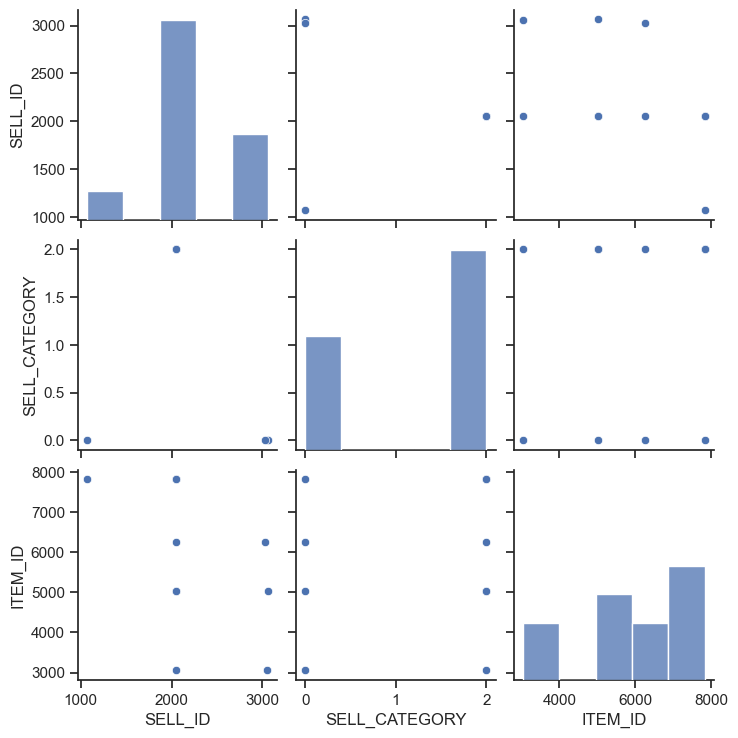

In [174]:
# distributions of variables
# scatterplot of numeric variables
sns.pairplot(sold)

In [175]:
# view data set
transaction.head()

,CALENDAR_DATE,PRICE,QUANTITY,SELL_ID,SELL_CATEGORY
0,01/01/12,15.50,46,1070,0
1,01/01/12,12.73,22,2051,2
2,01/01/12,12.75,18,2052,2
3,01/01/12,12.60,30,2053,2
4,01/02/12,15.50,70,1070,0


In [176]:
# inferences on all features
transaction.describe()
transaction.describe(include=['O'])

,PRICE,QUANTITY,SELL_ID,SELL_CATEGORY
count,5404.000000,5404.000000,5404.00000,5404.000000
mean,12.868729,44.335307,1806.50000,1.500000
std,1.563922,25.502597,425.25841,0.866106
min,10.120000,8.000000,1070.00000,0.000000
25%,11.530000,24.000000,1805.75000,1.500000
50%,12.640000,36.000000,2051.50000,2.000000
75%,13.557500,60.000000,2052.25000,2.000000
max,16.500000,124.000000,2053.00000,2.000000


,CALENDAR_DATE
count,5404
unique,1348
top,03/01/13
freq,16


In [177]:
# check for null values
transaction[transaction.isnull().any(axis=1)]

,CALENDAR_DATE,PRICE,QUANTITY,SELL_ID,SELL_CATEGORY


Important: It’s supposed the PRICE for that product in that day will not vary.

In details:
CALENDAR_DATE: a date/time variable, having the time always set to 00:00 AM.

PRICE: a numeric variable, associated with the price of the product identified by the SELL_ID.

QUANTITY: a numeric variable, associated with the quantity of the product sold, identified by the SELL_ID.

SELL_ID: a categorical variable, identifier of the product sold.

SELL_CATEGORY: a categorical variable, category of the product sold.

(array([ 360.,  509.,  629., 1351., 1082.,  122.,  389.,  240.,  482.,
         240.]),
 array([10.12 , 10.758, 11.396, 12.034, 12.672, 13.31 , 13.948, 14.586,
        15.224, 15.862, 16.5  ]),
 <BarContainer object of 10 artists>)

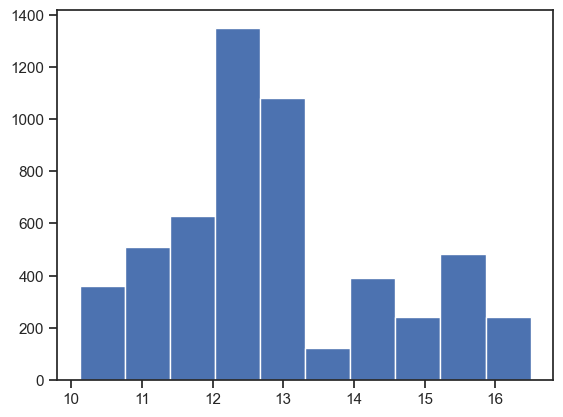

In [178]:
plt.hist(transaction.PRICE)

- It’s reasonable to consider this as a bi-modal distribution since it has peaks at two distinct points.
- It might also represent a mixture of multiple distributions.

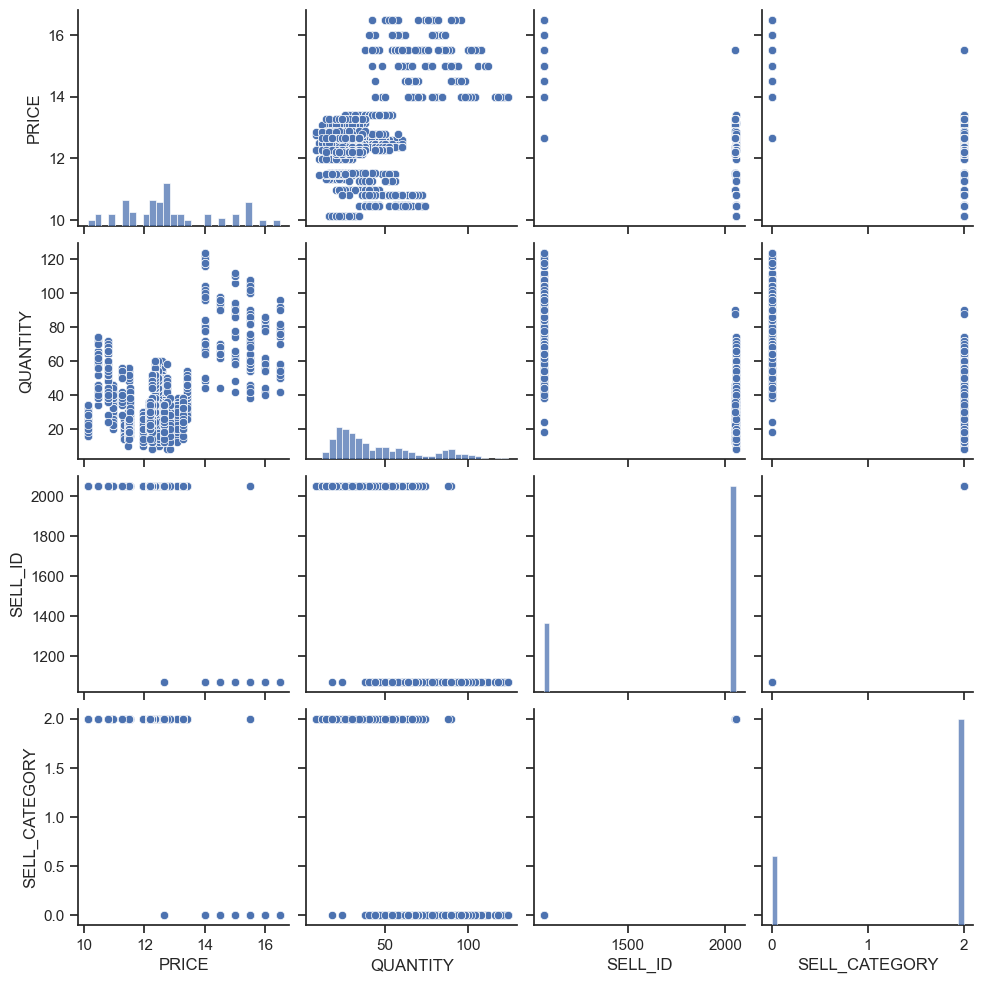

In [179]:
# univariate and bivariate analysis
sns.pairplot(transaction)

In [180]:
# view dataset
date_info.head()

,CALENDAR_DATE,YEAR,HOLIDAY,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
0,1/1/12,2012,New Year,1,0,24.8,0
1,1/2/12,2012,New Year,0,0,24.8,0
2,1/3/12,2012,New Year,0,0,32.0,1
3,1/4/12,2012,NaN,0,0,32.0,1
4,1/5/12,2012,NaN,0,0,24.8,0


In [181]:
# inferences on all features
date_info.describe()
date_info.describe(include=['O'])

,YEAR,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
count,1349.000000,1349.000000,1349.000000,1349.000000,1349.000000
mean,2013.375093,0.285397,0.204596,56.326019,0.862120
std,1.073073,0.451771,0.403556,20.227597,0.344902
min,2012.000000,0.000000,0.000000,14.000000,0.000000
25%,2012.000000,0.000000,0.000000,35.600000,1.000000
50%,2013.000000,0.000000,0.000000,60.800000,1.000000
75%,2014.000000,1.000000,0.000000,75.200000,1.000000
max,2015.000000,1.000000,1.000000,87.800000,1.000000


,CALENDAR_DATE,HOLIDAY
count,1349,105
unique,1348,8
top,3/1/13,Luner New Year
freq,2,28


In [182]:
# data types
date_info.dtypes

CALENDAR_DATE           object
YEAR                     int64
HOLIDAY                 object
IS_WEEKEND               int64
IS_SCHOOLBREAK           int64
AVERAGE_TEMPERATURE    float64
IS_OUTDOOR               int64
dtype: object

In [183]:
# check for nulls
# a lot of missing values in holiday
date_info[date_info.isnull().any(axis=1)]

,CALENDAR_DATE,YEAR,HOLIDAY,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
3,1/4/12,2012,NaN,0,0,32.0,1
4,1/5/12,2012,NaN,0,0,24.8,0
5,1/6/12,2012,NaN,0,0,23.0,0
6,1/7/12,2012,NaN,1,0,26.6,0
7,1/8/12,2012,NaN,1,0,26.6,0
8,1/9/12,2012,NaN,0,0,23.0,0
9,1/10/12,2012,NaN,0,0,24.8,0
10,1/11/12,2012,NaN,0,0,21.2,0
11,1/12/12,2012,NaN,0,0,24.8,0
12,1/13/12,2012,NaN,0,0,26.6,0


In [185]:
# replace missing values
date_info['HOLIDAY'] = date_info['HOLIDAY'].fillna("No Holiday")
date_info

,CALENDAR_DATE,YEAR,HOLIDAY,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
0,1/1/12,2012,New Year,1,0,24.8,0
1,1/2/12,2012,New Year,0,0,24.8,0
2,1/3/12,2012,New Year,0,0,32.0,1
3,1/4/12,2012,No Holiday,0,0,32.0,1
4,1/5/12,2012,No Holiday,0,0,24.8,0
5,1/6/12,2012,No Holiday,0,0,23.0,0
6,1/7/12,2012,No Holiday,1,0,26.6,0
7,1/8/12,2012,No Holiday,1,0,26.6,0
8,1/9/12,2012,No Holiday,0,0,23.0,0
9,1/10/12,2012,No Holiday,0,0,24.8,0


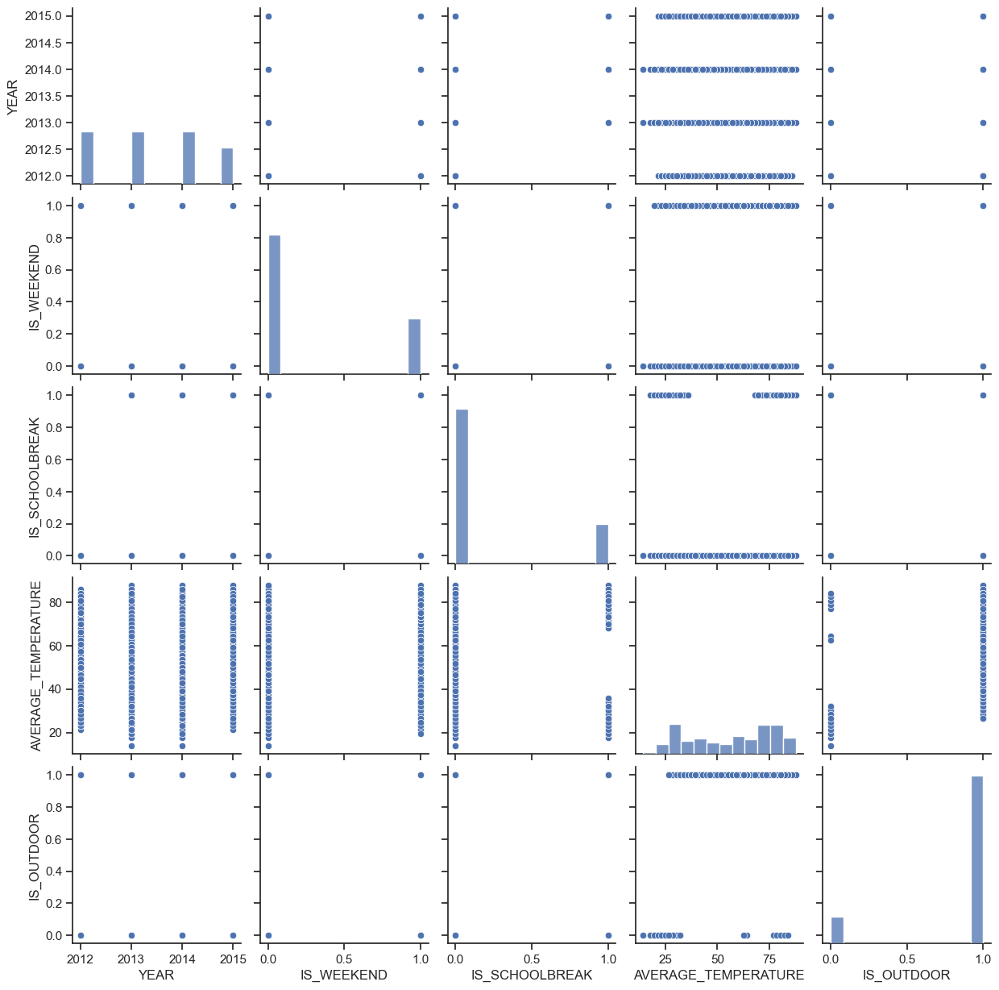

In [186]:
# pairplot for distribution
sns.pairplot(date_info)

- Many of these variables are categorical, which limits the insights we can gain from their distribution plots.

#### Further eda

In [187]:
np.unique(date_info['HOLIDAY'])

array(['Dragon Boat Festivel', 'Labor Day', 'Luner New Year',
       'Mid-Autumn Day', 'National Day', 'New Year', 'No Holiday',
       'Qing Ming Festival', 'WWII Celebration'], dtype=object)

In [188]:
date_info['HOLIDAY'].value_counts()

HOLIDAY
No Holiday              1244
Luner New Year            28
National Day              21
Qing Ming Festival        12
Labor Day                 12
Dragon Boat Festivel      12
New Year                  10
Mid-Autumn Day             7
WWII Celebration           3
Name: count, dtype: int64

In [189]:
# oldest date
date_info['CALENDAR_DATE'].min()

'1/1/12'

In [190]:
# earliest date
date_info['CALENDAR_DATE'].max()

'9/9/15'

In [191]:
# shape of data frame
date_info.shape

(1349, 7)

In [192]:
# check if any null values
date_info[date_info.isnull().any(axis=1)]

,CALENDAR_DATE,YEAR,HOLIDAY,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR


In [193]:
# lets transpose some columns in item name i.e encoding them and concat with sell_id
# concatenate along columns i.s axis=1
pd.concat([sold.SELL_ID, pd.get_dummies(sold.ITEM_NAME)], axis=1)

,SELL_ID,BURGER,COFFEE,COKE,LEMONADE
0,1070,True,False,False,False
1,3055,False,True,False,False
2,3067,False,False,True,False
3,3028,False,False,False,True
4,2051,True,False,False,False
5,2051,False,False,True,False
6,2052,True,False,False,False
7,2052,False,False,False,True
8,2053,True,False,False,False
9,2053,False,False,True,False


- It was observed that the 'sell ID' is not unique. For example, coffee IDs 3055, and 2053 could be consolidated into a single, unique sell ID to simplify the data.

In [194]:
# get unique sell id for each row
pd.concat([sold.SELL_ID, pd.get_dummies(sold.ITEM_NAME)], axis=1).groupby(sold.SELL_ID).sum()

,SELL_ID,BURGER,COFFEE,COKE,LEMONADE
SELL_ID,,,,,
1070,1070,1,0,0,0
2051,4102,1,0,1,0
2052,4104,1,0,0,1
2053,6159,1,1,1,0
3028,3028,0,0,0,1
3055,3055,0,1,0,0
3067,3067,0,0,1,0


<a name ='5'></a>
### Combined data


In [196]:
# merge and drop unneccesary columns
merge_data1 = pd.merge(sold.drop(['ITEM_ID'], axis=1), transaction.drop(['SELL_CATEGORY'], axis=1), on= 'SELL_ID')
merge_data1.tail(20)

# Make merge_data1 unique on combination of all return features
unique_merge_data1 = merge_data1.groupby(['SELL_ID', 'SELL_CATEGORY', 'ITEM_NAME', 'CALENDAR_DATE', 'PRICE']).QUANTITY.sum()

,SELL_ID,SELL_CATEGORY,ITEM_NAME,CALENDAR_DATE,PRICE,QUANTITY
10788,2053,2,COFFEE,8/22/15,11.26,38
10789,2053,2,COFFEE,8/23/15,11.26,36
10790,2053,2,COFFEE,8/24/15,11.26,52
10791,2053,2,COFFEE,8/25/15,11.26,54
10792,2053,2,COFFEE,8/26/15,11.26,56
10793,2053,2,COFFEE,8/27/15,11.26,56
10794,2053,2,COFFEE,8/28/15,11.26,50
10795,2053,2,COFFEE,8/29/15,11.26,42
10796,2053,2,COFFEE,8/30/15,11.26,38
10797,2053,2,COFFEE,8/31/15,11.26,54


In [198]:
unique_merge_data1

SELL_ID  SELL_CATEGORY  ITEM_NAME  CALENDAR_DATE  PRICE
1070     0              BURGER     01/01/12       15.50     46
                                   01/01/13       15.50     60
                                   01/01/14       15.50     72
                                   01/01/15       14.00     66
                                   01/02/12       15.50     70
                                   01/02/13       15.50     68
                                   01/02/14       15.50     76
                                   01/02/15       14.00    102
                                   01/03/12       15.50     62
                                   01/03/13       15.50     70
                                   01/03/14       15.50     68
                                   01/03/15       14.00     68
                                   01/04/12       15.50     88
                                   01/04/13       15.50    100
                                   01/04/14       15.50     74

In [199]:
# shape of merge data
merge_data1.shape
intermediate_data = unique_merge_data1.reset_index()

(10808, 6)

In [200]:
unique_merge_data1.shape

(10792,)

In [203]:
# view data
intermediate_data

,SELL_ID,SELL_CATEGORY,ITEM_NAME,CALENDAR_DATE,PRICE,QUANTITY
0,1070,0,BURGER,01/01/12,15.50,46
1,1070,0,BURGER,01/01/13,15.50,60
2,1070,0,BURGER,01/01/14,15.50,72
3,1070,0,BURGER,01/01/15,14.00,66
4,1070,0,BURGER,01/02/12,15.50,70
5,1070,0,BURGER,01/02/13,15.50,68
6,1070,0,BURGER,01/02/14,15.50,76
7,1070,0,BURGER,01/02/15,14.00,102
8,1070,0,BURGER,01/03/12,15.50,62
9,1070,0,BURGER,01/03/13,15.50,70


In [204]:
# check dates
intermediate_data['CALENDAR_DATE'].min()

'01/01/12'

In [205]:
# check dates, noticed obs dropped by a year
intermediate_data['CALENDAR_DATE'].max()

'9/30/14'

In [206]:
# incorporate the date_info data
combined_data = pd.merge(intermediate_data, date_info, on= 'CALENDAR_DATE')
combined_data.head()

,SELL_ID,SELL_CATEGORY,ITEM_NAME,CALENDAR_DATE,PRICE,QUANTITY,YEAR,HOLIDAY,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
0,1070,0,BURGER,1/13/12,15.5,100,2012,No Holiday,0,0,26.6,0
1,1070,0,BURGER,1/13/13,15.5,70,2013,No Holiday,1,0,30.2,0
2,1070,0,BURGER,1/13/14,15.5,104,2014,No Holiday,0,0,28.4,0
3,1070,0,BURGER,1/13/15,14.0,116,2015,No Holiday,0,0,28.4,0
4,1070,0,BURGER,1/14/12,15.5,74,2012,No Holiday,1,0,23.0,0


In [207]:
# check shape
combined_data.shape

(6696, 12)

In [208]:
# check for missing values
# no missing values
combined_data[combined_data.isnull().any(axis=1)]

,SELL_ID,SELL_CATEGORY,ITEM_NAME,CALENDAR_DATE,PRICE,QUANTITY,YEAR,HOLIDAY,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR


In [209]:
# check various categories
np.unique(combined_data.HOLIDAY)
np.unique(combined_data.IS_WEEKEND)
np.unique(combined_data.IS_SCHOOLBREAK)

array(['Dragon Boat Festivel', 'Labor Day', 'Luner New Year',
       'Mid-Autumn Day', 'No Holiday'], dtype=object)

array([0, 1])

array([0, 1])

In [210]:
# These attributes are very important in our sales but has nothing to do with price, i.e if Holiday then sales increases, 
# if schoolbreak and weekend then sales will increase. we don't want this effect as we only interested in seeing price effect.
# all effects on sales other than price will be removed from the data set. 
bau_data = combined_data[(combined_data['HOLIDAY']=='No Holiday') & (combined_data['IS_SCHOOLBREAK']==0) & 
                         (combined_data['IS_WEEKEND']==0)]
bau_data.head()

,SELL_ID,SELL_CATEGORY,ITEM_NAME,CALENDAR_DATE,PRICE,QUANTITY,YEAR,HOLIDAY,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
0,1070,0,BURGER,1/13/12,15.5,100,2012,No Holiday,0,0,26.6,0
2,1070,0,BURGER,1/13/14,15.5,104,2014,No Holiday,0,0,28.4,0
3,1070,0,BURGER,1/13/15,14.0,116,2015,No Holiday,0,0,28.4,0
6,1070,0,BURGER,1/14/14,15.5,86,2014,No Holiday,0,0,28.4,1
7,1070,0,BURGER,1/14/15,14.0,122,2015,No Holiday,0,0,30.2,0


In [211]:
# shape of dataframe
bau_data.shape

(3768, 12)

In [212]:
# Check categories
np.unique(bau_data.HOLIDAY)
np.unique(bau_data.IS_WEEKEND)
np.unique(bau_data.IS_SCHOOLBREAK)

array(['No Holiday'], dtype=object)

array([0])

array([0])

In [213]:
# check if weekend was removed
bau_data[bau_data['IS_WEEKEND']==1]

,SELL_ID,SELL_CATEGORY,ITEM_NAME,CALENDAR_DATE,PRICE,QUANTITY,YEAR,HOLIDAY,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR


In [214]:
bau_data[bau_data['HOLIDAY']!='No Holiday']

,SELL_ID,SELL_CATEGORY,ITEM_NAME,CALENDAR_DATE,PRICE,QUANTITY,YEAR,HOLIDAY,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR


<a name='5.1'></a>
#### Exploratory Data Analysis for combined

(array([1884.,    0.,    0.,  942.,    0.,    0.,  471.,    0.,    0.,
         471.]),
 array([0. , 0.3, 0.6, 0.9, 1.2, 1.5, 1.8, 2.1, 2.4, 2.7, 3. ]),
 <BarContainer object of 10 artists>)

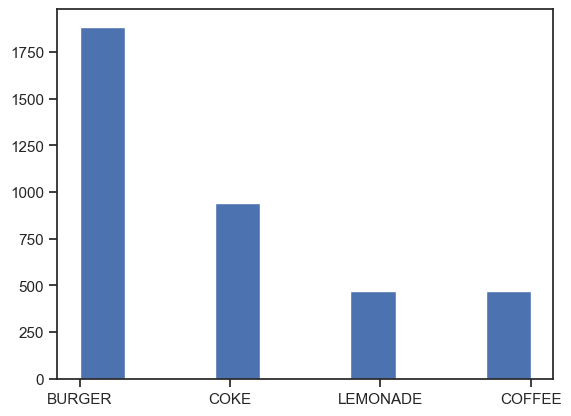

In [215]:
# item name
plt.hist(bau_data.ITEM_NAME)

(array([ 411.,  388.,  441., 1159.,  790.,  108.,  122.,  111.,  174.,
          64.]),
 array([10.12 , 10.758, 11.396, 12.034, 12.672, 13.31 , 13.948, 14.586,
        15.224, 15.862, 16.5  ]),
 <BarContainer object of 10 artists>)

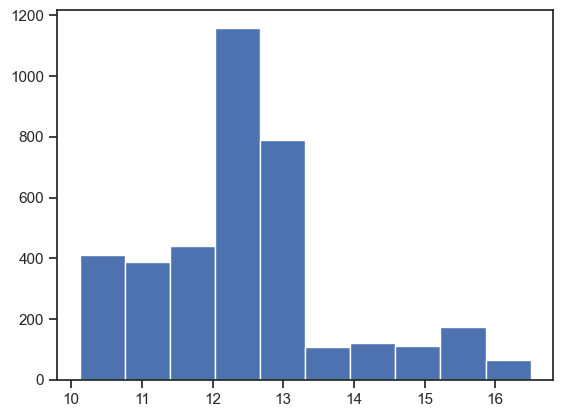

In [216]:
# Price
plt.hist(bau_data.PRICE)

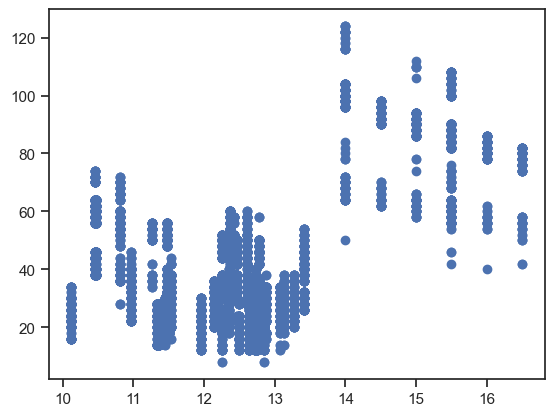

In [217]:
# Price vs Quantity in combined data set
plt.scatter(combined_data.PRICE, combined_data.QUANTITY)

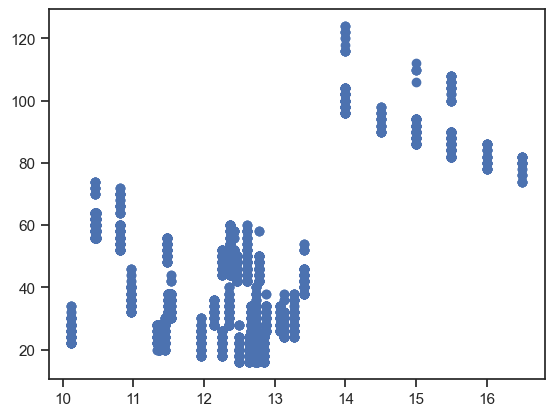

In [218]:
# in bau data set this does not contain the special days
plt.scatter(bau_data.PRICE, bau_data.QUANTITY)

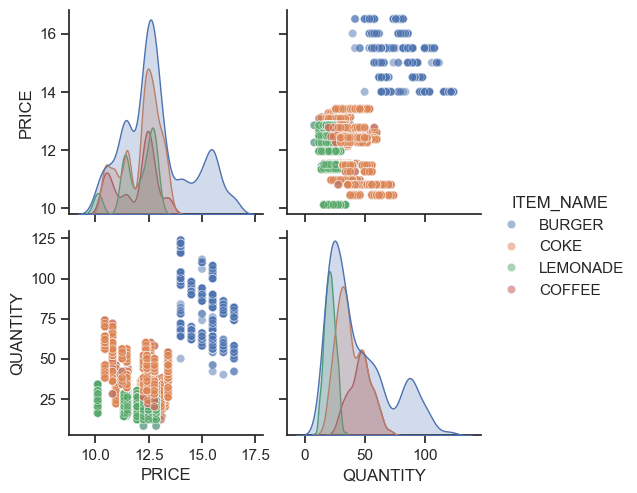

In [229]:
# pairplot for combined data 
sns.pairplot(combined_data[['PRICE','QUANTITY','ITEM_NAME']], hue = 'ITEM_NAME', plot_kws={'alpha':0.5})

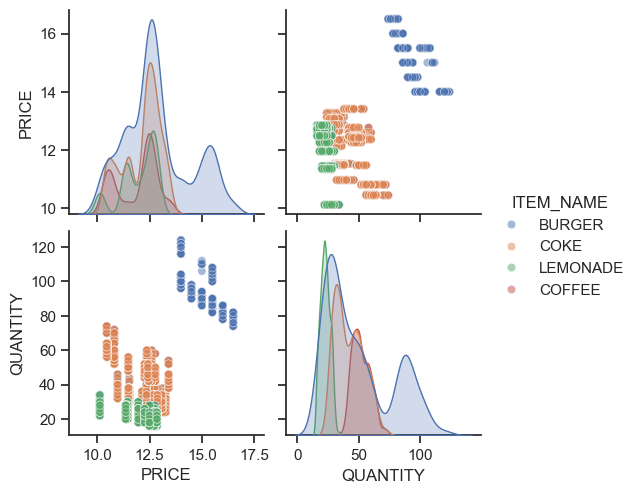

In [228]:
# pairplot for bau data
sns.pairplot(bau_data[['PRICE','QUANTITY','ITEM_NAME']], hue = 'ITEM_NAME', plot_kws={'alpha':0.5})

The price density plot shows a bimodal distribution. The graph indicates that, across all quantities, an increase in price corresponds with a decrease in the quantity sold. However, Coke data is not visible in this view. Next, we can proceed to calculate the price elasticities.

<a name='5.2'></a>
#### Uncovering facets of data with visualization

,SELL_ID,SELL_CATEGORY,ITEM_NAME,CALENDAR_DATE,PRICE,QUANTITY,YEAR,HOLIDAY,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
5022,2053,2,COFFEE,1/13/12,12.60,58,2012,No Holiday,0,0,26.6,0
5023,2053,2,COFFEE,1/13/13,13.41,32,2013,No Holiday,1,0,30.2,0
5024,2053,2,COFFEE,1/13/14,12.37,60,2014,No Holiday,0,0,28.4,0
5025,2053,2,COFFEE,1/13/15,10.81,66,2015,No Holiday,0,0,28.4,0
5026,2053,2,COFFEE,1/14/12,12.60,42,2012,No Holiday,1,0,23.0,0


(837, 12)

,SELL_ID,SELL_CATEGORY,PRICE,QUANTITY,YEAR,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
count,837.0,837.0,837.000000,837.000000,837.000000,837.000000,837.000000,837.000000,837.000000
mean,2053.0,2.0,11.934636,46.802867,2013.351254,0.284349,0.200717,56.255914,0.878136
std,0.0,0.0,0.947643,9.909910,1.063043,0.451373,0.400776,20.005316,0.327324
min,2053.0,2.0,10.450000,20.000000,2012.000000,0.000000,0.000000,14.000000,0.000000
25%,2053.0,2.0,10.810000,40.000000,2012.000000,0.000000,0.000000,35.600000,1.000000
50%,2053.0,2.0,12.370000,48.000000,2013.000000,0.000000,0.000000,59.000000,1.000000
75%,2053.0,2.0,12.600000,54.000000,2014.000000,1.000000,0.000000,75.200000,1.000000
max,2053.0,2.0,13.410000,74.000000,2015.000000,1.000000,1.000000,87.800000,1.000000


<Axes: xlabel='PRICE', ylabel='QUANTITY'>

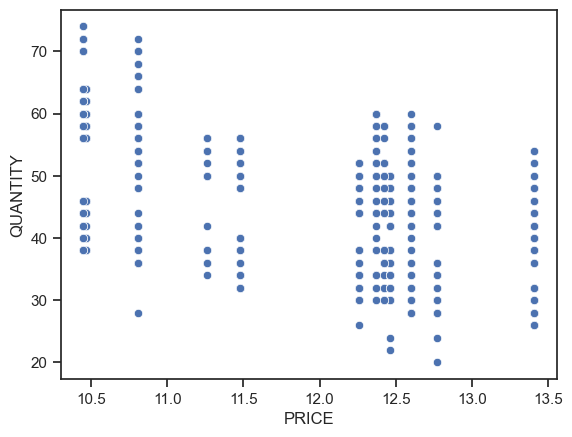

In [235]:
# Facets of coffee
coffee = combined_data[combined_data['ITEM_NAME'] == 'COFFEE']
coffee.head()
coffee.shape 
coffee.describe()
sns.scatterplot(x=coffee.PRICE, y=coffee.QUANTITY)

From the above scatter plot it is clearly visible that there must be different types of burgers being sold. Now let's see the same distribution when we differentiate with SELL_ID which indicates if the burger was a part of the combo and hence, must be treated separately.

<Axes: xlabel='PRICE', ylabel='QUANTITY'>

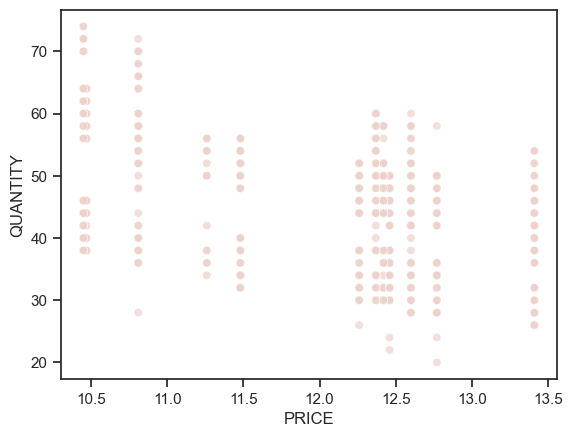

In [237]:
# alpha for opacity, legend could be full to see various SELL_ID and combo
coffee = combined_data[combined_data['ITEM_NAME'] == 'COFFEE']
sns.scatterplot(data = coffee, x = coffee.PRICE, y = coffee.QUANTITY , hue = 'SELL_ID', legend=False, alpha = 0.7)

In [238]:
np.unique(combined_data.SELL_ID)

array([1070, 2051, 2052, 2053])

In [239]:
np.unique(combined_data.SELL_CATEGORY)

array([0, 2])

,SELL_ID,SELL_CATEGORY,ITEM_NAME,CALENDAR_DATE,PRICE,QUANTITY,YEAR,HOLIDAY,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
5022,2053,2,COFFEE,1/13/12,12.60,58,2012,No Holiday,0,0,26.6,0
5023,2053,2,COFFEE,1/13/13,13.41,32,2013,No Holiday,1,0,30.2,0
5024,2053,2,COFFEE,1/13/14,12.37,60,2014,No Holiday,0,0,28.4,0
5025,2053,2,COFFEE,1/13/15,10.81,66,2015,No Holiday,0,0,28.4,0
5026,2053,2,COFFEE,1/14/12,12.60,42,2012,No Holiday,1,0,23.0,0


,SELL_ID,SELL_CATEGORY,PRICE,QUANTITY,YEAR,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
count,837.0,837.0,837.000000,837.000000,837.000000,837.000000,837.000000,837.000000,837.000000
mean,2053.0,2.0,11.934636,46.802867,2013.351254,0.284349,0.200717,56.255914,0.878136
std,0.0,0.0,0.947643,9.909910,1.063043,0.451373,0.400776,20.005316,0.327324
min,2053.0,2.0,10.450000,20.000000,2012.000000,0.000000,0.000000,14.000000,0.000000
25%,2053.0,2.0,10.810000,40.000000,2012.000000,0.000000,0.000000,35.600000,1.000000
50%,2053.0,2.0,12.370000,48.000000,2013.000000,0.000000,0.000000,59.000000,1.000000
75%,2053.0,2.0,12.600000,54.000000,2014.000000,1.000000,0.000000,75.200000,1.000000
max,2053.0,2.0,13.410000,74.000000,2015.000000,1.000000,1.000000,87.800000,1.000000


<Axes: xlabel='PRICE', ylabel='QUANTITY'>

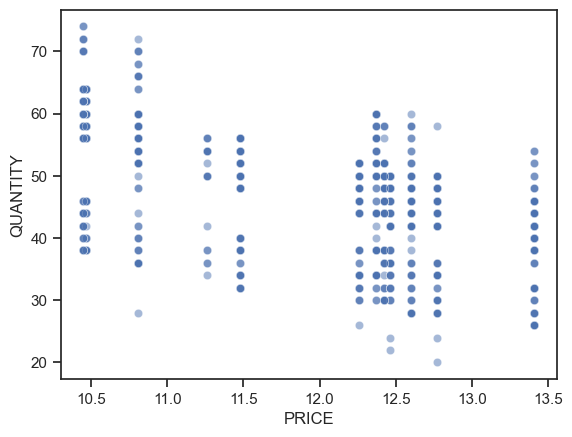

In [241]:
# create visuals for particular sell id a combo with coffee
coffee_2053 = combined_data[(combined_data['ITEM_NAME'] == 'COFFEE') & (combined_data['SELL_ID'] == 2053)]
coffee_2053.head()
coffee_2053.describe()
sns.scatterplot(data = coffee_2053, x = coffee_2053.PRICE, y = coffee_2053.QUANTITY, alpha = 0.5)

- SELL_ID is a factor contributing to the creation of distinct groups and behaviors. Thus, it is advisable to separate the data by ITEM_NAME. This is important because including data with two different distributions, as observed in the post, can complicate model fitting.

<a name='6'></a>
### Modeling

                            OLS Regression Results                            
Dep. Variable:               QUANTITY   R-squared:                       0.281
Model:                            OLS   Adj. R-squared:                  0.281
Method:                 Least Squares   F-statistic:                     327.0
Date:                Mon, 26 Aug 2024   Prob (F-statistic):           6.20e-62
Time:                        01:37:08   Log-Likelihood:                -2968.5
No. Observations:                 837   AIC:                             5941.
Df Residuals:                     835   BIC:                             5951.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    113.0116      3.673     30.770      0.0

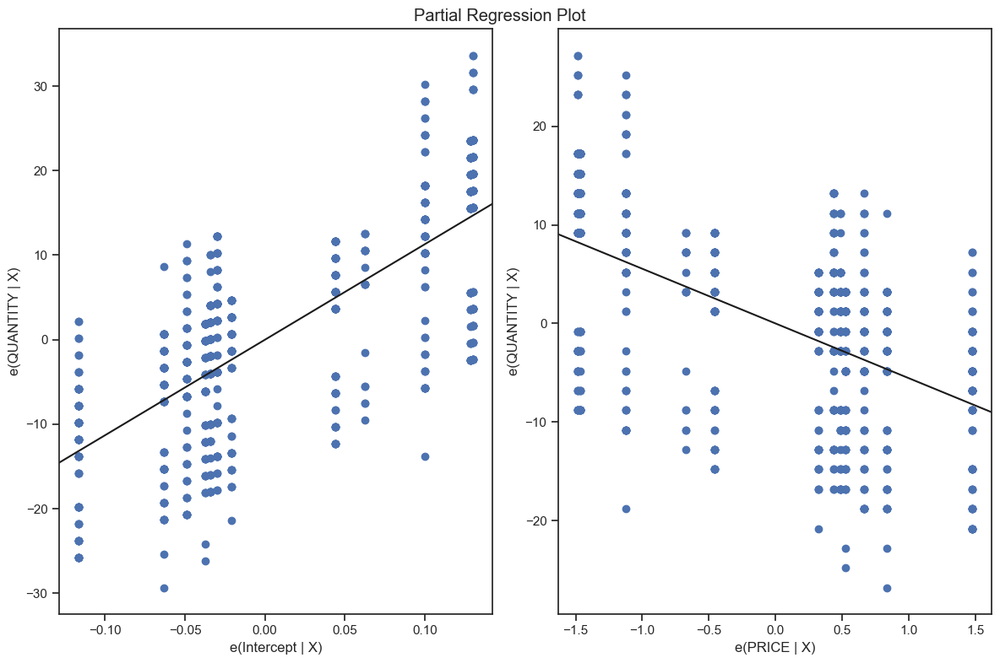

In [242]:
# using combined data
coffee_model = ols("QUANTITY ~ PRICE", data=coffee_2053).fit() 
print(coffee_model.summary())
fig = plt.figure(figsize=(12,8))
fig = sm.graphics.plot_partregress_grid(coffee_model, fig=fig)

- Significant variations are causing poor model fit, indicated by a low R-squared value. Let's analyze the data again after removing holidays, weekends, and school breaks.

,SELL_ID,SELL_CATEGORY,ITEM_NAME,CALENDAR_DATE,PRICE,QUANTITY,YEAR,HOLIDAY,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
5022,2053,2,COFFEE,1/13/12,12.60,58,2012,No Holiday,0,0,26.6,0
5024,2053,2,COFFEE,1/13/14,12.37,60,2014,No Holiday,0,0,28.4,0
5025,2053,2,COFFEE,1/13/15,10.81,66,2015,No Holiday,0,0,28.4,0
5028,2053,2,COFFEE,1/14/14,12.37,52,2014,No Holiday,0,0,28.4,1
5029,2053,2,COFFEE,1/14/15,10.81,66,2015,No Holiday,0,0,30.2,0


(471, 12)

,SELL_ID,SELL_CATEGORY,PRICE,QUANTITY,YEAR,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
count,471.0,471.0,471.000000,471.000000,471.000000,471.0,471.0,471.000000,471.000000
mean,2053.0,2.0,11.907452,51.864119,2013.186837,0.0,0.0,53.691720,0.883227
std,0.0,0.0,0.974797,7.329234,1.059464,0.0,0.0,18.736854,0.321491
min,2053.0,2.0,10.450000,38.000000,2012.000000,0.0,0.0,14.000000,0.000000
25%,2053.0,2.0,10.810000,46.000000,2012.000000,0.0,0.0,35.600000,1.000000
50%,2053.0,2.0,12.370000,50.000000,2013.000000,0.0,0.0,53.600000,1.000000
75%,2053.0,2.0,12.600000,58.000000,2014.000000,0.0,0.0,70.700000,1.000000
max,2053.0,2.0,13.410000,74.000000,2015.000000,0.0,0.0,87.800000,1.000000


<Axes: xlabel='PRICE', ylabel='QUANTITY'>

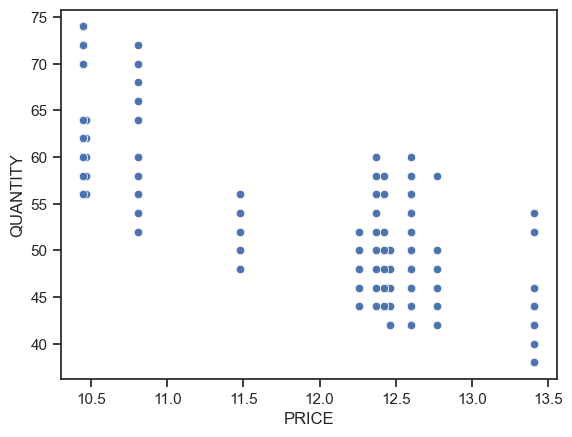

In [243]:
# bau dataset subseted on item name coffee
coffee = bau_data[bau_data['ITEM_NAME'] == 'COFFEE']
coffee.head()
coffee.shape
coffee.describe()
sns.scatterplot(x = coffee.PRICE, y = coffee.QUANTITY)

* Some of the right region missing in the graph corresponds to special days and holidays.

<Axes: xlabel='PRICE', ylabel='QUANTITY'>

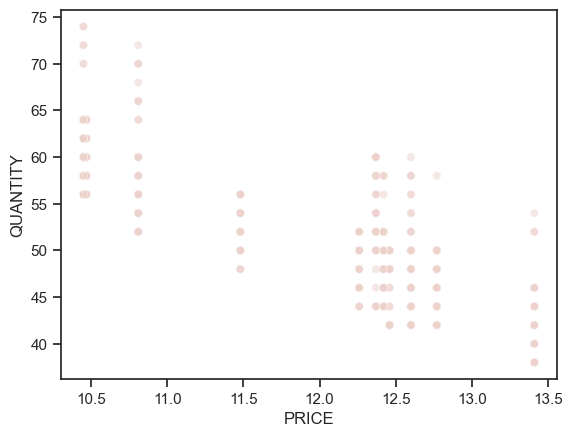

In [245]:
coffee = bau_data[bau_data['ITEM_NAME'] == 'COFFEE']
sns.scatterplot(data=coffee, x =coffee.PRICE, y= coffee.QUANTITY, hue= 'SELL_ID', legend=False, alpha=0.5)

In [246]:
# unique sell id, the bau data has all the SEll ids
np.unique(bau_data.SELL_ID)

array([1070, 2051, 2052, 2053])

In [247]:
# bau data has the unique sell ids
np.unique(bau_data.SELL_CATEGORY)

array([0, 2])

,SELL_ID,SELL_CATEGORY,ITEM_NAME,CALENDAR_DATE,PRICE,QUANTITY,YEAR,HOLIDAY,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
5022,2053,2,COFFEE,1/13/12,12.60,58,2012,No Holiday,0,0,26.6,0
5024,2053,2,COFFEE,1/13/14,12.37,60,2014,No Holiday,0,0,28.4,0
5025,2053,2,COFFEE,1/13/15,10.81,66,2015,No Holiday,0,0,28.4,0
5028,2053,2,COFFEE,1/14/14,12.37,52,2014,No Holiday,0,0,28.4,1
5029,2053,2,COFFEE,1/14/15,10.81,66,2015,No Holiday,0,0,30.2,0


,SELL_ID,SELL_CATEGORY,PRICE,QUANTITY,YEAR,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
count,471.0,471.0,471.000000,471.000000,471.000000,471.0,471.0,471.000000,471.000000
mean,2053.0,2.0,11.907452,51.864119,2013.186837,0.0,0.0,53.691720,0.883227
std,0.0,0.0,0.974797,7.329234,1.059464,0.0,0.0,18.736854,0.321491
min,2053.0,2.0,10.450000,38.000000,2012.000000,0.0,0.0,14.000000,0.000000
25%,2053.0,2.0,10.810000,46.000000,2012.000000,0.0,0.0,35.600000,1.000000
50%,2053.0,2.0,12.370000,50.000000,2013.000000,0.0,0.0,53.600000,1.000000
75%,2053.0,2.0,12.600000,58.000000,2014.000000,0.0,0.0,70.700000,1.000000
max,2053.0,2.0,13.410000,74.000000,2015.000000,0.0,0.0,87.800000,1.000000


<Axes: xlabel='PRICE', ylabel='QUANTITY'>

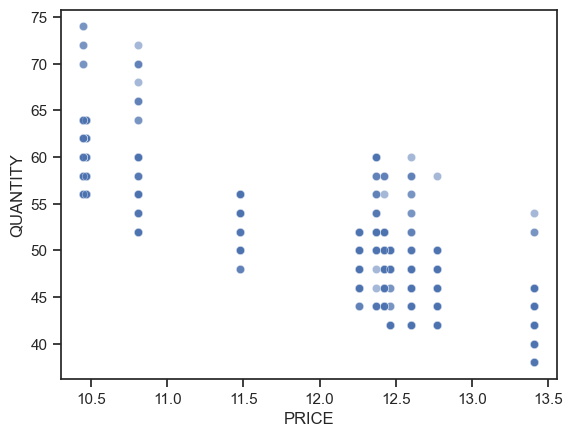

In [250]:
# subset sell id 2053 coffee and combo

coffee_2053 = bau_data[(bau_data['ITEM_NAME'] == 'COFFEE') & (bau_data['SELL_ID'] == 2053)]

coffee_2053.head()
coffee_2053.describe()
sns.scatterplot(data= coffee_2053, x =coffee_2053.PRICE, y= coffee_2053.QUANTITY, alpha=0.5)


- The scatter plot looks much cleaner now, though there still appear to be two distinct trends.

                            OLS Regression Results                            
Dep. Variable:               QUANTITY   R-squared:                       0.665
Model:                            OLS   Adj. R-squared:                  0.664
Method:                 Least Squares   F-statistic:                     929.6
Date:                Mon, 26 Aug 2024   Prob (F-statistic):          2.38e-113
Time:                        01:41:26   Log-Likelihood:                -1348.7
No. Observations:                 471   AIC:                             2701.
Df Residuals:                     469   BIC:                             2710.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    124.8547      2.402     51.981      0.0

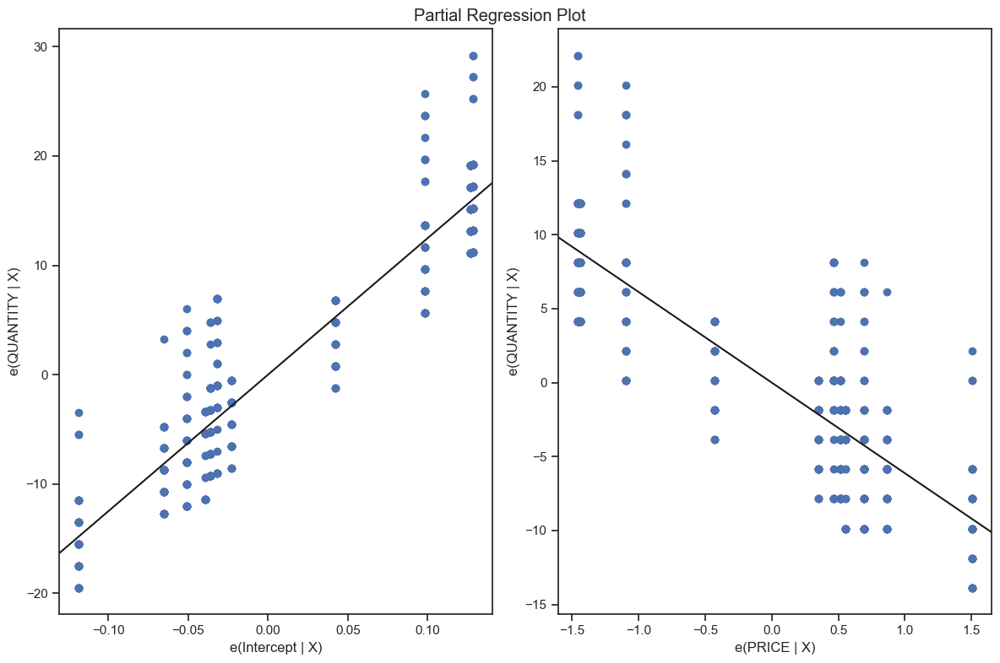

In [251]:
# fit ols model on the new data
coffee_model = ols('QUANTITY ~ PRICE', data=coffee_2053).fit()
print(coffee_model.summary())
fig = plt.figure(figsize=(12,8))
fig = sm.graphics.plot_partregress_grid(coffee_model, fig=fig)

- Variation has decreased with the increase in R-squared, indicating that the model captures the trend more effectively.
- However, two distinct trends are still evident. We will re-examine the data to identify any additional factors that could help further refine our model.

In [256]:
# look at the data again
bau_data

,SELL_ID,SELL_CATEGORY,ITEM_NAME,CALENDAR_DATE,PRICE,QUANTITY,YEAR,HOLIDAY,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
0,1070,0,BURGER,1/13/12,15.50,100,2012,No Holiday,0,0,26.6,0
2,1070,0,BURGER,1/13/14,15.50,104,2014,No Holiday,0,0,28.4,0
3,1070,0,BURGER,1/13/15,14.00,116,2015,No Holiday,0,0,28.4,0
6,1070,0,BURGER,1/14/14,15.50,86,2014,No Holiday,0,0,28.4,1
7,1070,0,BURGER,1/14/15,14.00,122,2015,No Holiday,0,0,30.2,0
10,1070,0,BURGER,1/15/14,15.50,104,2014,No Holiday,0,0,26.6,0
11,1070,0,BURGER,1/15/15,14.00,104,2015,No Holiday,0,0,32.0,1
12,1070,0,BURGER,1/16/12,15.50,104,2012,No Holiday,0,0,23.0,0
14,1070,0,BURGER,1/16/14,15.50,100,2014,No Holiday,0,0,24.8,0
15,1070,0,BURGER,1/16/15,14.00,100,2015,No Holiday,0,0,32.0,1


In [257]:
# doesn't sure what outdoor means, lets filter outdoor aswell
bau2_data = combined_data[(combined_data['HOLIDAY'] == 'No Holiday') & (combined_data['IS_SCHOOLBREAK'] ==0) & 
                          (combined_data['IS_WEEKEND'] == 1) & (combined_data['IS_OUTDOOR'] ==1)]

,SELL_ID,SELL_CATEGORY,ITEM_NAME,CALENDAR_DATE,PRICE,QUANTITY,YEAR,HOLIDAY,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
5030,2053,2,COFFEE,1/15/12,12.60,32,2012,No Holiday,1,0,32.0,1
5045,2053,2,COFFEE,1/18/15,10.81,40,2015,No Holiday,1,0,33.8,1
5048,2053,2,COFFEE,1/19/14,12.37,34,2014,No Holiday,1,0,30.2,1
5082,2053,2,COFFEE,1/28/12,12.60,34,2012,No Holiday,1,0,32.0,1
5103,2053,2,COFFEE,10/11/14,12.77,34,2014,No Holiday,1,0,62.6,1


,SELL_ID,SELL_CATEGORY,PRICE,QUANTITY,YEAR,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
count,164.0,164.0,164.000000,164.000000,164.000000,164.0,164.0,164.000000,164.0
mean,2053.0,2.0,11.910366,35.365854,2013.195122,1.0,0.0,57.408537,1.0
std,0.0,0.0,0.992299,5.274111,1.084628,0.0,0.0,15.850085,0.0
min,2053.0,2.0,10.450000,26.000000,2012.000000,1.0,0.0,26.600000,1.0
25%,2053.0,2.0,10.810000,30.000000,2012.000000,1.0,0.0,42.800000,1.0
50%,2053.0,2.0,12.370000,36.000000,2013.000000,1.0,0.0,59.000000,1.0
75%,2053.0,2.0,12.600000,38.000000,2014.000000,1.0,0.0,71.600000,1.0
max,2053.0,2.0,13.410000,46.000000,2015.000000,1.0,0.0,84.200000,1.0


<Axes: xlabel='PRICE', ylabel='QUANTITY'>

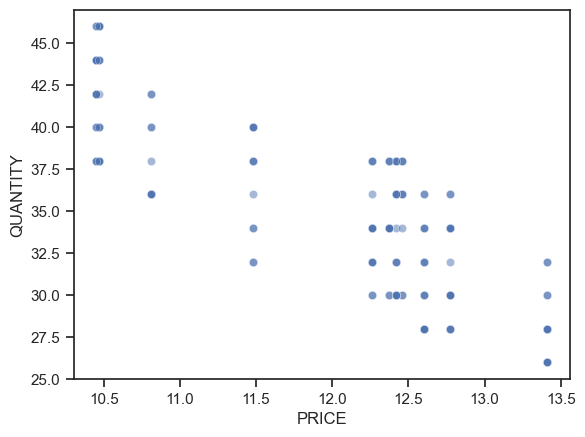

In [259]:
# create combo with coffee data set
coffee_2053 = bau2_data[(bau2_data['ITEM_NAME'] == 'COFFEE') & (bau2_data['SELL_ID'] == 2053)]
coffee_2053.head()
coffee_2053.describe()
sns.scatterplot(data= coffee_2053, x = coffee_2053.PRICE, y= coffee_2053.QUANTITY, alpha= 0.5)

- The plot is much cleaner now, showing only one group.

                            OLS Regression Results                            
Dep. Variable:               QUANTITY   R-squared:                       0.683
Model:                            OLS   Adj. R-squared:                  0.682
Method:                 Least Squares   F-statistic:                     349.8
Date:                Mon, 26 Aug 2024   Prob (F-statistic):           2.58e-42
Time:                        01:45:17   Log-Likelihood:                -410.58
No. Observations:                 164   AIC:                             825.2
Df Residuals:                     162   BIC:                             831.4
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     87.7006      2.808     31.234      0.0

<Figure size 1200x800 with 0 Axes>

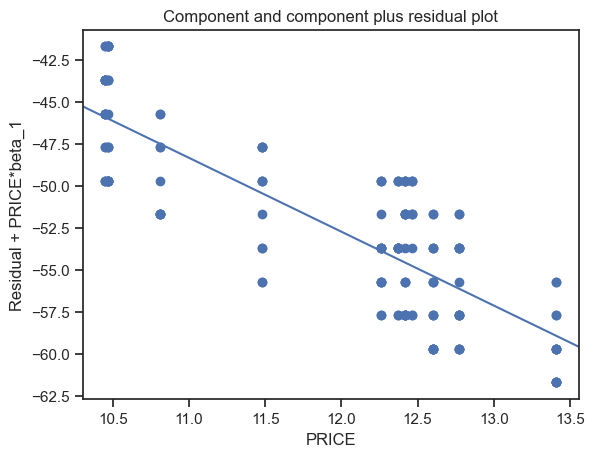

In [260]:
# creating model on this data
coffee_model = ols("QUANTITY ~ PRICE", data= coffee_2053).fit()
print(coffee_model.summary())
fig = plt.figure(figsize=(12, 8))
fig = sm.graphics.plot_ccpr(coffee_model, "PRICE")

- The plot reveals a clear trend with a well-defined line and minimal variations. For this specific cafe's coffee with a SELL_ID of 2053, we can confidently estimate the price coefficient to be approximately -4.3941, which gives a price elasticity of -4.

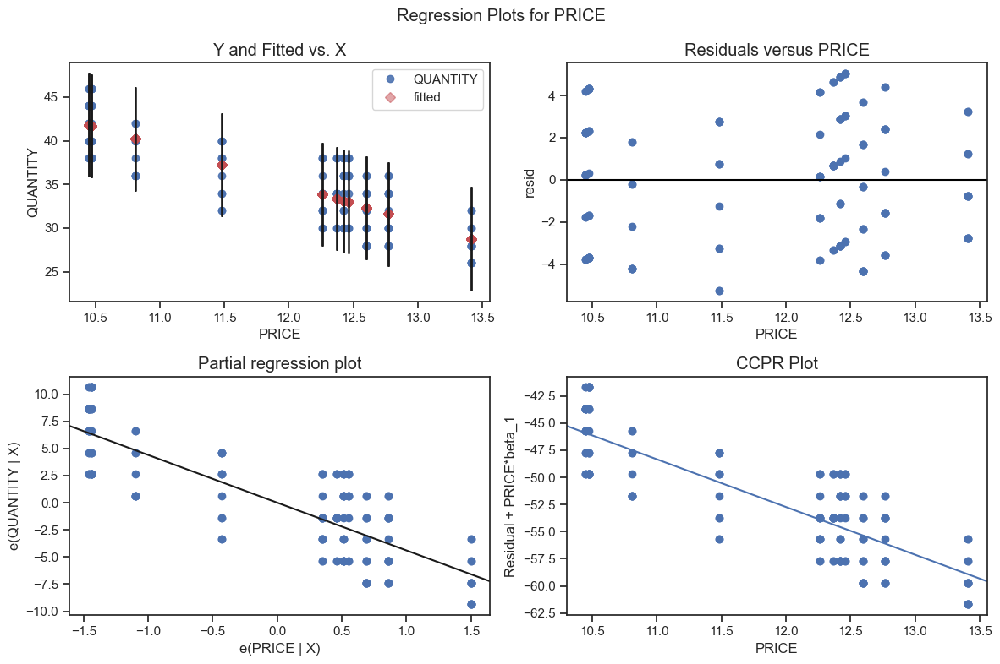

In [262]:
# lets view same model in antoher way
fig = plt.figure(figsize=(12, 8))
fig = sm.graphics.plot_regress_exog(coffee_model, "PRICE", fig=fig)

- Having determined how to calculate the price elasticity for a specific item, coffee with SELL_ID 2053, we will now extend this method to other items.

<a name='7'></a>
### Applying Model on All Products

,SELL_ID,SELL_CATEGORY,ITEM_NAME,CALENDAR_DATE,PRICE,QUANTITY,YEAR,HOLIDAY,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
837,2051,2,BURGER,1/13/12,12.73,40,2012,No Holiday,0,0,26.6,0
838,2051,2,BURGER,1/13/13,13.13,26,2013,No Holiday,1,0,30.2,0
839,2051,2,BURGER,1/13/14,13.27,38,2014,No Holiday,0,0,28.4,0
840,2051,2,BURGER,1/13/15,11.53,38,2015,No Holiday,0,0,28.4,0
841,2051,2,BURGER,1/14/12,12.73,24,2012,No Holiday,1,0,23.0,0


,SELL_ID,SELL_CATEGORY,PRICE,QUANTITY,YEAR,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
count,837.0,837.0,837.000000,837.000000,837.000000,837.000000,837.000000,837.000000,837.000000
mean,2051.0,2.0,12.368017,29.498208,2013.351254,0.284349,0.200717,56.255914,0.878136
std,0.0,0.0,0.726329,5.782878,1.063043,0.451373,0.400776,20.005316,0.327324
min,2051.0,2.0,10.970000,12.000000,2012.000000,0.000000,0.000000,14.000000,0.000000
25%,2051.0,2.0,11.530000,26.000000,2012.000000,0.000000,0.000000,35.600000,1.000000
50%,2051.0,2.0,12.660000,30.000000,2013.000000,0.000000,0.000000,59.000000,1.000000
75%,2051.0,2.0,13.080000,34.000000,2014.000000,1.000000,0.000000,75.200000,1.000000
max,2051.0,2.0,13.270000,46.000000,2015.000000,1.000000,1.000000,87.800000,1.000000


<Axes: xlabel='PRICE', ylabel='QUANTITY'>

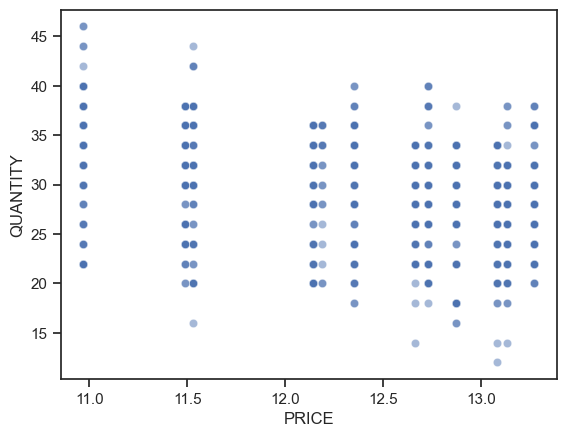

In [266]:
# just cross-checking burger and combo with sell id 2051
burger_2051 = combined_data[(combined_data['ITEM_NAME'] == 'BURGER') & (combined_data['SELL_ID'] == 2051)]
burger_2051.head()
burger_2051.describe()
sns.scatterplot(data= burger_2051, x = burger_2051.PRICE, y= burger_2051.QUANTITY, alpha=0.5)

- The graph looks decent as it is not chaotic or disorganized.

                            OLS Regression Results                            
Dep. Variable:               QUANTITY   R-squared:                       0.130
Model:                            OLS   Adj. R-squared:                  0.129
Method:                 Least Squares   F-statistic:                     124.7
Date:                Mon, 26 Aug 2024   Prob (F-statistic):           4.45e-27
Time:                        01:55:19   Log-Likelihood:                -2597.8
No. Observations:                 837   AIC:                             5200.
Df Residuals:                     835   BIC:                             5209.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     64.9906      3.184     20.411      0.0

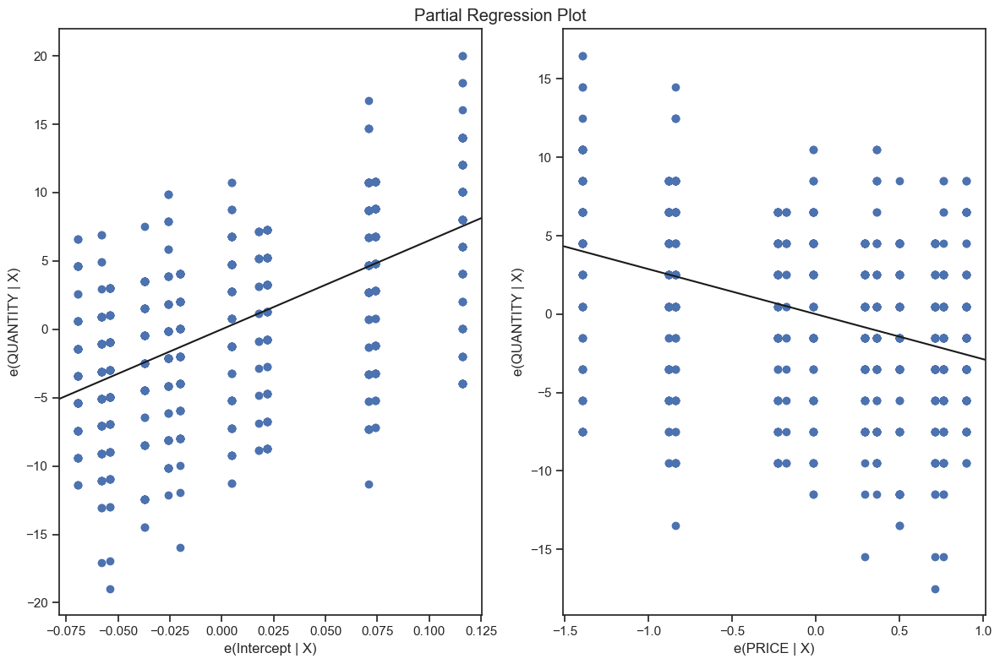

In [267]:
burger_model = ols('QUANTITY ~ PRICE', data=burger_2051).fit()
print(burger_model.summary())
fig = plt.figure(figsize=(12,8))
fig = sm.graphics.plot_partregress_grid(burger_model, fig=fig)

- Once again, the R-squared value is very low, indicating that while the model captures the downward trend, there is still a significant amount of variation.

,SELL_ID,SELL_CATEGORY,ITEM_NAME,CALENDAR_DATE,PRICE,QUANTITY,YEAR,HOLIDAY,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
1674,2051,2,COKE,1/13/12,12.73,40,2012,No Holiday,0,0,26.6,0
1675,2051,2,COKE,1/13/13,13.13,26,2013,No Holiday,1,0,30.2,0
1676,2051,2,COKE,1/13/14,13.27,38,2014,No Holiday,0,0,28.4,0
1677,2051,2,COKE,1/13/15,11.53,38,2015,No Holiday,0,0,28.4,0
1678,2051,2,COKE,1/14/12,12.73,24,2012,No Holiday,1,0,23.0,0


(1674, 12)

,SELL_ID,SELL_CATEGORY,PRICE,QUANTITY,YEAR,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
count,1674.000000,1674.0,1674.000000,1674.000000,1674.000000,1674.000000,1674.000000,1674.000000,1674.000000
mean,2052.000000,2.0,12.151326,38.150538,2013.351254,0.284349,0.200717,56.255914,0.878136
std,1.000299,0.0,0.871405,11.861375,1.062726,0.451239,0.400656,19.999336,0.327226
min,2051.000000,2.0,10.450000,12.000000,2012.000000,0.000000,0.000000,14.000000,0.000000
25%,2051.000000,2.0,11.490000,30.000000,2012.000000,0.000000,0.000000,35.600000,1.000000
50%,2052.000000,2.0,12.370000,36.000000,2013.000000,0.000000,0.000000,59.000000,1.000000
75%,2053.000000,2.0,12.770000,48.000000,2014.000000,1.000000,0.000000,75.200000,1.000000
max,2053.000000,2.0,13.410000,74.000000,2015.000000,1.000000,1.000000,87.800000,1.000000


<Axes: xlabel='PRICE', ylabel='QUANTITY'>

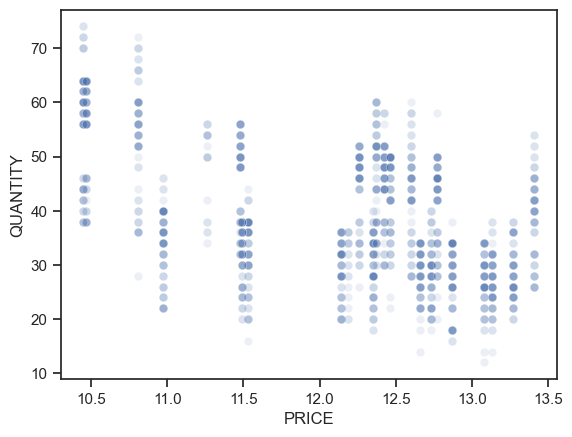

In [273]:
# let's look at coke
coke = combined_data[combined_data['ITEM_NAME'] == 'COKE']
coke.head()
coke.shape
coke.describe()
sns.scatterplot(x = coke.PRICE, y= coke.QUANTITY, alpha=0.1)

- The scatter plot isn't very clean and shows two distinct groupings. After fitting a model, we observe a better R-squared value compared to the burger data, but it remains low despite capturing the downward trend.

                            OLS Regression Results                            
Dep. Variable:               QUANTITY   R-squared:                       0.246
Model:                            OLS   Adj. R-squared:                  0.245
Method:                 Least Squares   F-statistic:                     544.2
Date:                Mon, 26 Aug 2024   Prob (F-statistic):          1.94e-104
Time:                        01:57:34   Log-Likelihood:                -6279.2
No. Observations:                1674   AIC:                         1.256e+04
Df Residuals:                    1672   BIC:                         1.257e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    120.1140      3.522     34.100      0.0

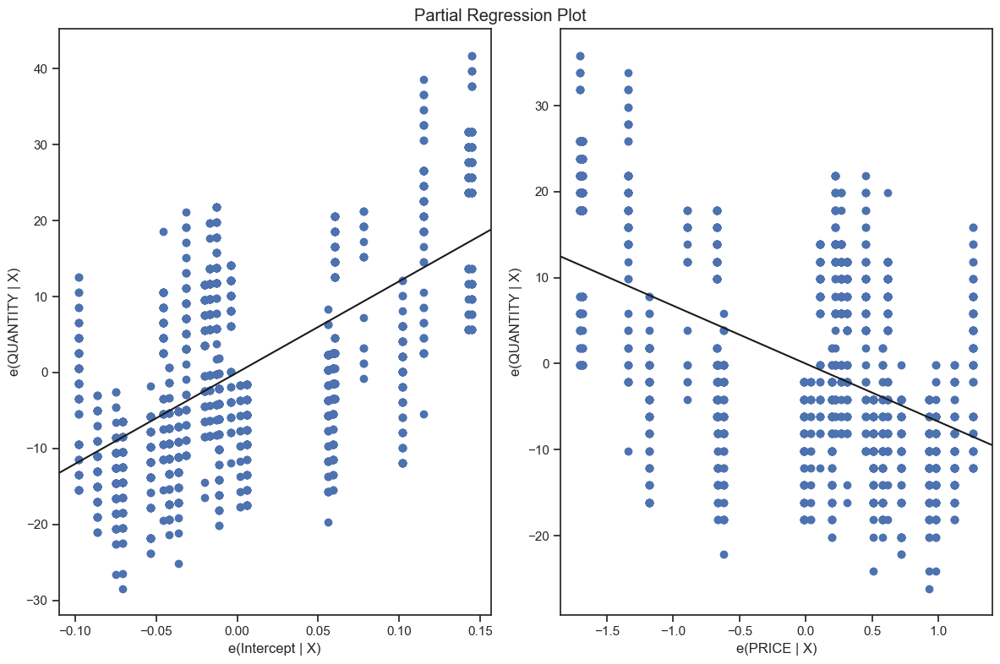

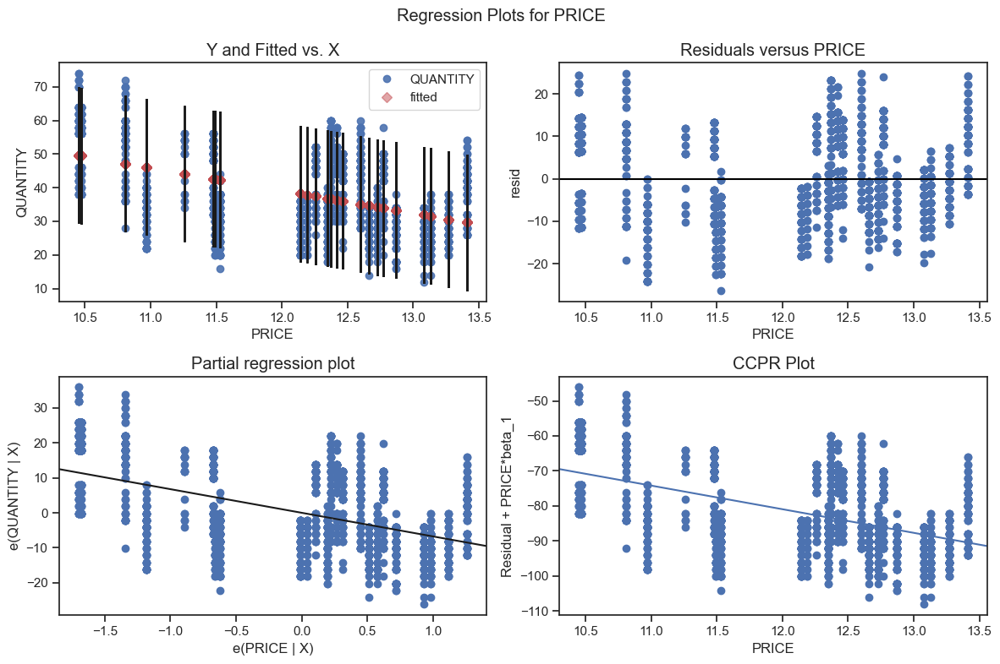

In [274]:
coke_model = ols("QUANTITY ~ PRICE", data=coke).fit()
print(coke_model.summary())
fig = plt.figure(figsize=(12, 8))
fig = sm.graphics.plot_partregress_grid(coke_model, fig=fig)
fig = plt.figure(figsize=(12, 8))
fig = sm.graphics.plot_regress_exog(coke_model, "PRICE", fig = fig)

,SELL_ID,SELL_CATEGORY,ITEM_NAME,CALENDAR_DATE,PRICE,QUANTITY,YEAR,HOLIDAY,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
5022,2053,2,COFFEE,1/13/12,12.60,58,2012,No Holiday,0,0,26.6,0
5023,2053,2,COFFEE,1/13/13,13.41,32,2013,No Holiday,1,0,30.2,0
5024,2053,2,COFFEE,1/13/14,12.37,60,2014,No Holiday,0,0,28.4,0
5025,2053,2,COFFEE,1/13/15,10.81,66,2015,No Holiday,0,0,28.4,0
5026,2053,2,COFFEE,1/14/12,12.60,42,2012,No Holiday,1,0,23.0,0


(837, 12)

,SELL_ID,SELL_CATEGORY,PRICE,QUANTITY,YEAR,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
count,837.0,837.0,837.000000,837.000000,837.000000,837.000000,837.000000,837.000000,837.000000
mean,2053.0,2.0,11.934636,46.802867,2013.351254,0.284349,0.200717,56.255914,0.878136
std,0.0,0.0,0.947643,9.909910,1.063043,0.451373,0.400776,20.005316,0.327324
min,2053.0,2.0,10.450000,20.000000,2012.000000,0.000000,0.000000,14.000000,0.000000
25%,2053.0,2.0,10.810000,40.000000,2012.000000,0.000000,0.000000,35.600000,1.000000
50%,2053.0,2.0,12.370000,48.000000,2013.000000,0.000000,0.000000,59.000000,1.000000
75%,2053.0,2.0,12.600000,54.000000,2014.000000,1.000000,0.000000,75.200000,1.000000
max,2053.0,2.0,13.410000,74.000000,2015.000000,1.000000,1.000000,87.800000,1.000000


<Axes: xlabel='PRICE', ylabel='QUANTITY'>

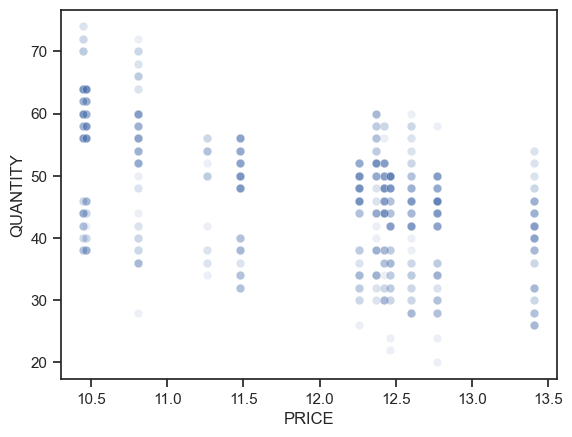

In [275]:
# Coffee
coffee = combined_data[combined_data['ITEM_NAME'] == 'COFFEE'] 
coffee.head()
coffee.shape
coffee.describe()
sns.scatterplot(x = coffee.PRICE, y = coffee.QUANTITY , alpha = 0.1)

- It appears there are two distinct groupings with a noticeable price gap.

                            OLS Regression Results                            
Dep. Variable:               QUANTITY   R-squared:                       0.281
Model:                            OLS   Adj. R-squared:                  0.281
Method:                 Least Squares   F-statistic:                     327.0
Date:                Mon, 26 Aug 2024   Prob (F-statistic):           6.20e-62
Time:                        01:58:15   Log-Likelihood:                -2968.5
No. Observations:                 837   AIC:                             5941.
Df Residuals:                     835   BIC:                             5951.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    113.0116      3.673     30.770      0.0

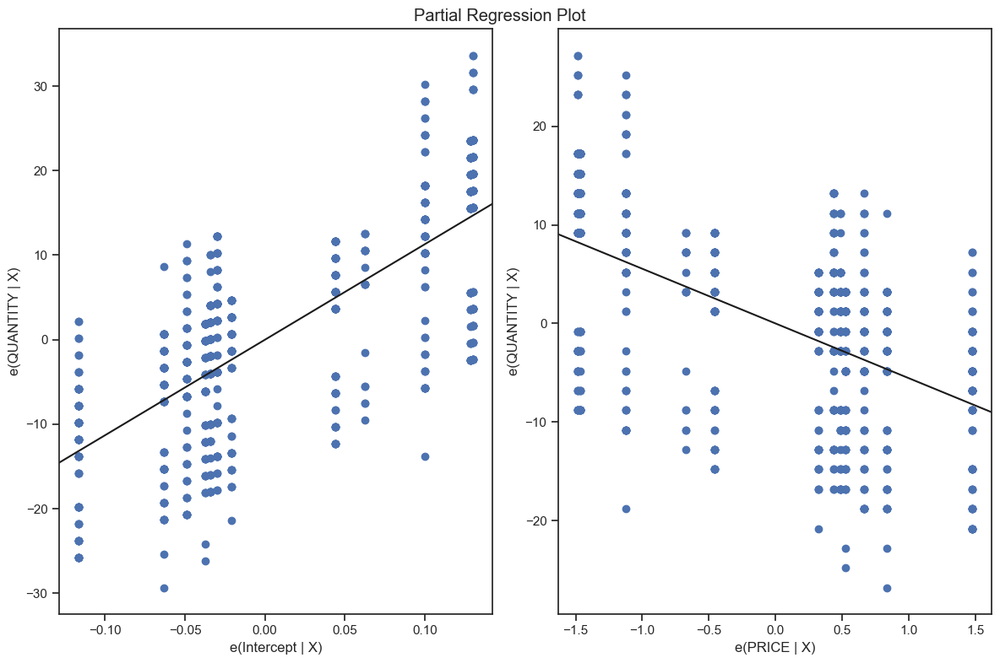

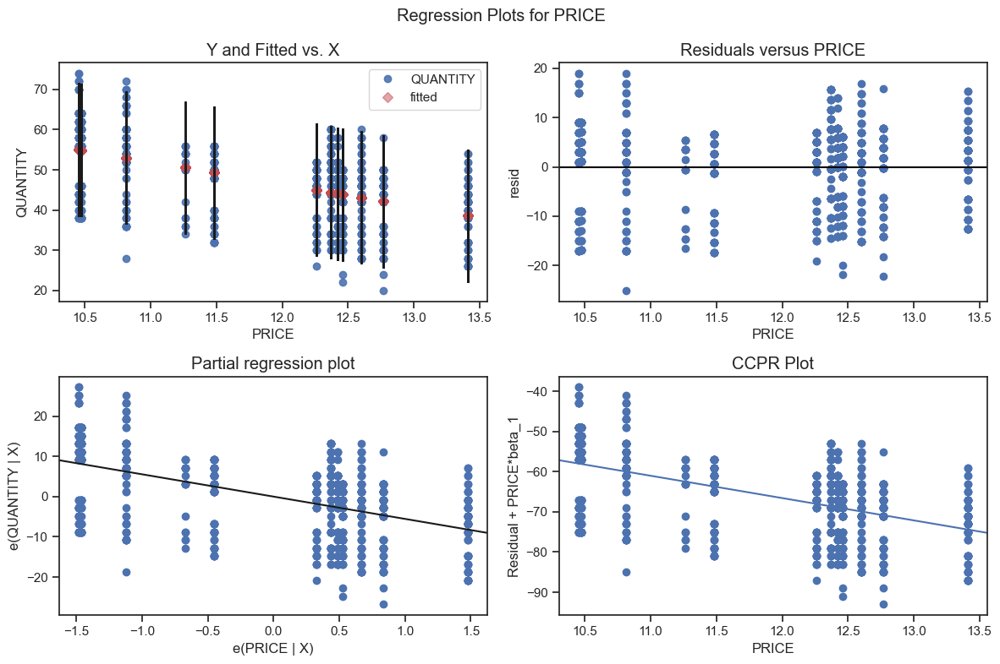

In [276]:
# build and fit the model
model = ols("QUANTITY ~ PRICE", data=coffee).fit() 
print(model.summary())
fig = plt.figure(figsize=(12,8))
fig = sm.graphics.plot_partregress_grid(model, fig=fig)
fig = plt.figure(figsize=(12,8))
fig = sm.graphics.plot_regress_exog(model, 'PRICE', fig=fig)

* Coefficient for price is -5, which means price elasticity is -5 

,SELL_ID,SELL_CATEGORY,ITEM_NAME,CALENDAR_DATE,PRICE,QUANTITY,YEAR,HOLIDAY,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
3348,2052,2,LEMONADE,1/13/12,12.75,26,2012,No Holiday,0,0,26.6,0
3349,2052,2,LEMONADE,1/13/13,12.64,18,2013,No Holiday,1,0,30.2,0
3350,2052,2,LEMONADE,1/13/14,11.96,24,2014,No Holiday,0,0,28.4,0
3351,2052,2,LEMONADE,1/13/15,11.45,28,2015,No Holiday,0,0,28.4,0
3352,2052,2,LEMONADE,1/14/12,12.75,20,2012,No Holiday,1,0,23.0,0


(837, 12)

,SELL_ID,SELL_CATEGORY,PRICE,QUANTITY,YEAR,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
count,837.0,837.0,837.000000,837.000000,837.000000,837.000000,837.000000,837.000000,837.000000
mean,2052.0,2.0,11.976918,20.910394,2013.351254,0.284349,0.200717,56.255914,0.878136
std,0.0,0.0,0.820698,4.514501,1.063043,0.451373,0.400776,20.005316,0.327324
min,2052.0,2.0,10.120000,8.000000,2012.000000,0.000000,0.000000,14.000000,0.000000
25%,2052.0,2.0,11.360000,18.000000,2012.000000,0.000000,0.000000,35.600000,1.000000
50%,2052.0,2.0,12.260000,20.000000,2013.000000,0.000000,0.000000,59.000000,1.000000
75%,2052.0,2.0,12.720000,24.000000,2014.000000,1.000000,0.000000,75.200000,1.000000
max,2052.0,2.0,12.850000,34.000000,2015.000000,1.000000,1.000000,87.800000,1.000000


<Axes: xlabel='PRICE', ylabel='QUANTITY'>

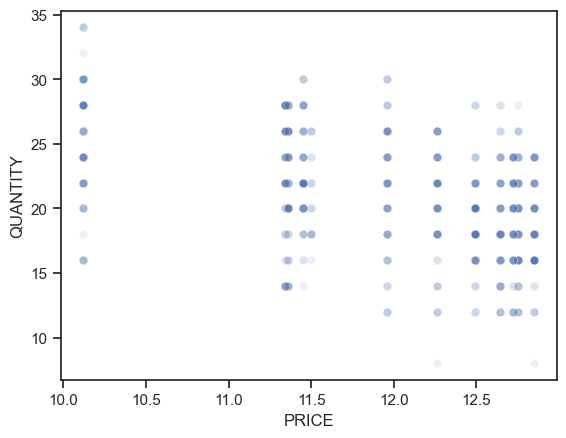

In [277]:
# Lemonade 
Lemonade_df = combined_data[combined_data['ITEM_NAME'] == 'LEMONADE']
Lemonade_df.head()
Lemonade_df.shape
Lemonade_df.describe()
sns.scatterplot(x = Lemonade_df.PRICE, y = Lemonade_df.QUANTITY , alpha = 0.1)

- This is similar to the patterns observed with previous beverages like Coke and coffee.

                            OLS Regression Results                            
Dep. Variable:               QUANTITY   R-squared:                       0.215
Model:                            OLS   Adj. R-squared:                  0.214
Method:                 Least Squares   F-statistic:                     228.7
Date:                Mon, 26 Aug 2024   Prob (F-statistic):           7.46e-46
Time:                        01:59:30   Log-Likelihood:                -2347.4
No. Observations:                 837   AIC:                             4699.
Df Residuals:                     835   BIC:                             4708.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     51.4615      2.025     25.416      0.0

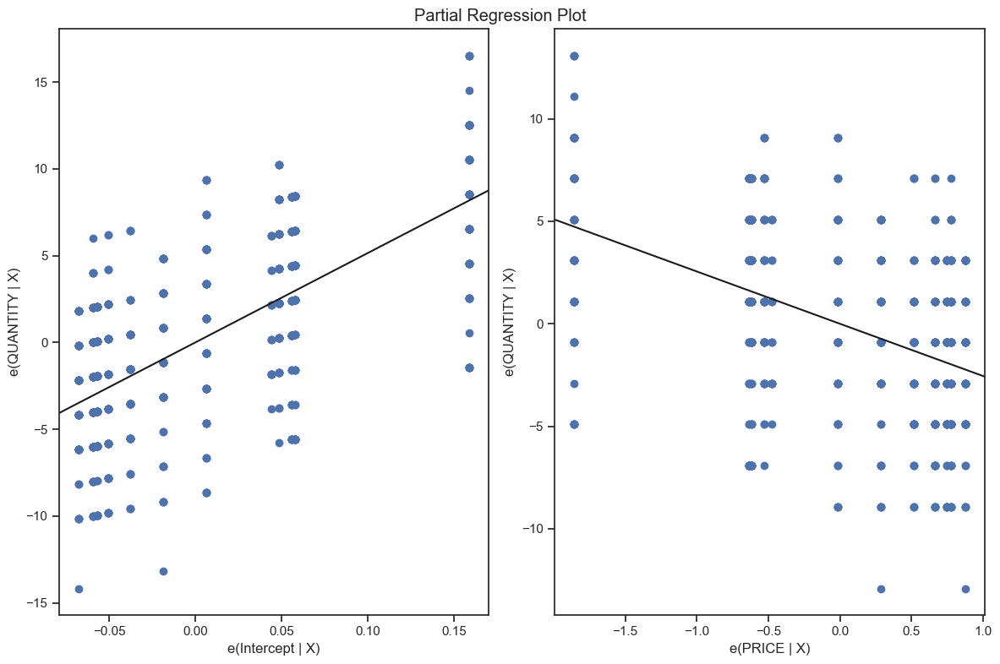

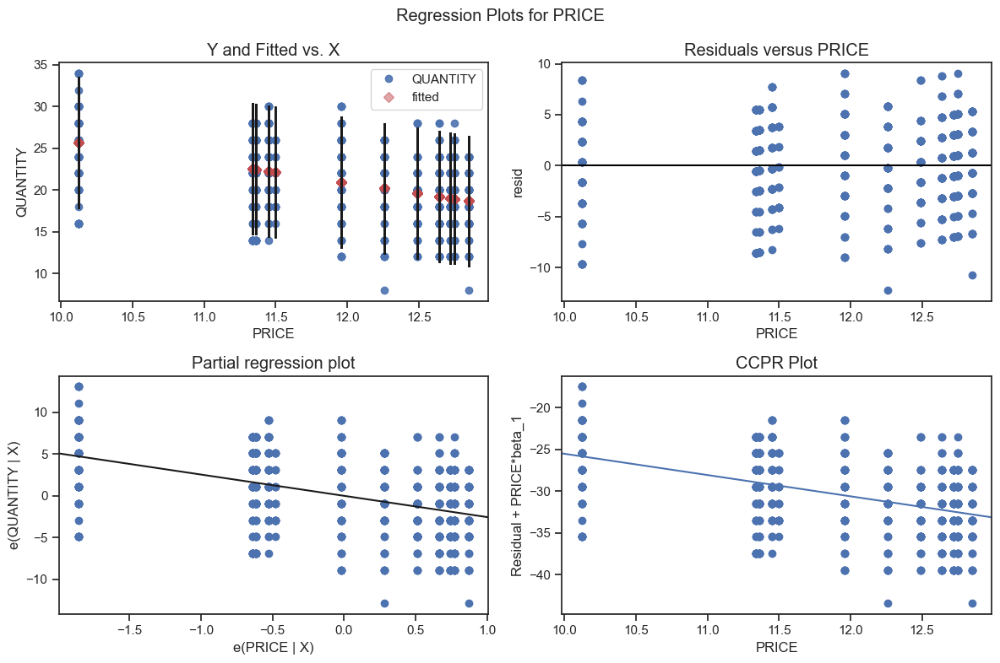

In [278]:
# fit model for lemonade
model = ols("QUANTITY ~ PRICE", data=Lemonade_df).fit()
print(model.summary())
fig = plt.figure(figsize=(12,8))
fig = sm.graphics.plot_partregress_grid(model, fig=fig)
fig = plt.figure(figsize=(12,8))
fig = sm.graphics.plot_regress_exog(model, 'PRICE', fig=fig)

- It appears to have a better R-squared compared to the burger data, with a price elasticity of -2.5.
- However, it still exhibits the same issues seen with other items. We will use a cleaner data function and develop a generic function that takes data as input and produces optimal results.

In [279]:
# lets find elasticities for all items
elasticities = {}

In [280]:
# Generic func to get price elasticities
def create_model_and_find_elasticity(data):
    model = ols("QUANTITY ~ PRICE", data).fit()
    price_elasticity = model.params[1]
    print('Price elasticiy of the product: ' + str(price_elasticity))
    print(model.summary())
    fig = plt.figure(figsize=(12, 8))
    fig = sm.graphics.plot_partregress_grid(model, fig=fig)
    return price_elasticity, model 

Price elasticiy of the product: -5.351266740100875
                            OLS Regression Results                            
Dep. Variable:               QUANTITY   R-squared:                       0.664
Model:                            OLS   Adj. R-squared:                  0.662
Method:                 Least Squares   F-statistic:                     320.1
Date:                Mon, 26 Aug 2024   Prob (F-statistic):           3.29e-40
Time:                        02:00:16   Log-Likelihood:                -391.92
No. Observations:                 164   AIC:                             787.8
Df Residuals:                     162   BIC:                             794.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
I

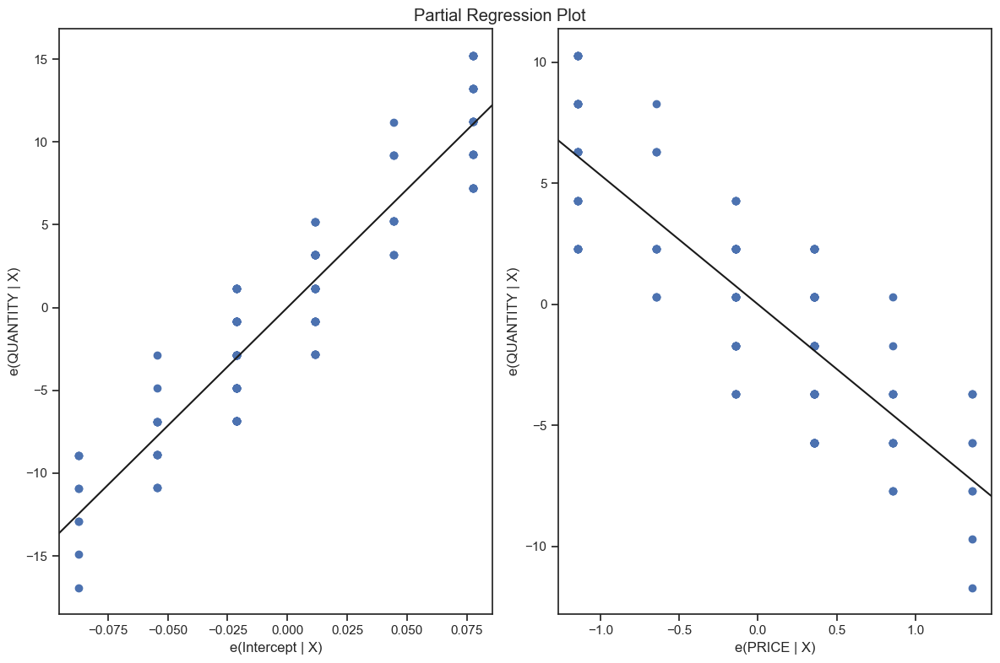

In [281]:
# apply function
price_elasticity, model_burger_1070 = create_model_and_find_elasticity(burger_1070)
elasticities['burger_1070'] = price_elasticity

- This trend indicates that burgers are highly sensitive to price changes.

Price elasticiy of the product: -1.353355848070374
                            OLS Regression Results                            
Dep. Variable:               QUANTITY   R-squared:                       0.119
Model:                            OLS   Adj. R-squared:                  0.113
Method:                 Least Squares   F-statistic:                     21.83
Date:                Mon, 26 Aug 2024   Prob (F-statistic):           6.22e-06
Time:                        02:00:56   Log-Likelihood:                -397.46
No. Observations:                 164   AIC:                             798.9
Df Residuals:                     162   BIC:                             805.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
I

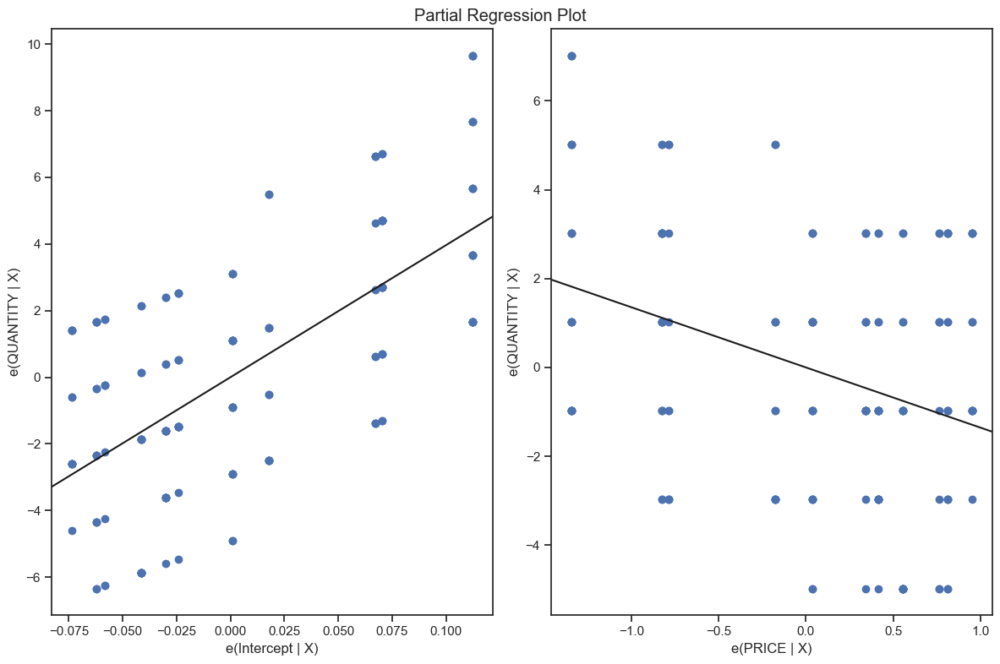

In [282]:
# for 2051 and other burger with unique sell id
burger2051_data = bau2_data[(bau2_data['ITEM_NAME'] == "BURGER") & (bau2_data['SELL_ID'] == 2051)]
elasticities['burger_2051'], model_burger_2051 = create_model_and_find_elasticity(burger2051_data)

Price elasticiy of the product: -1.6395517886297843
                            OLS Regression Results                            
Dep. Variable:               QUANTITY   R-squared:                       0.195
Model:                            OLS   Adj. R-squared:                  0.190
Method:                 Least Squares   F-statistic:                     39.31
Date:                Mon, 26 Aug 2024   Prob (F-statistic):           3.15e-09
Time:                        02:01:01   Log-Likelihood:                -405.10
No. Observations:                 164   AIC:                             814.2
Df Residuals:                     162   BIC:                             820.4
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------


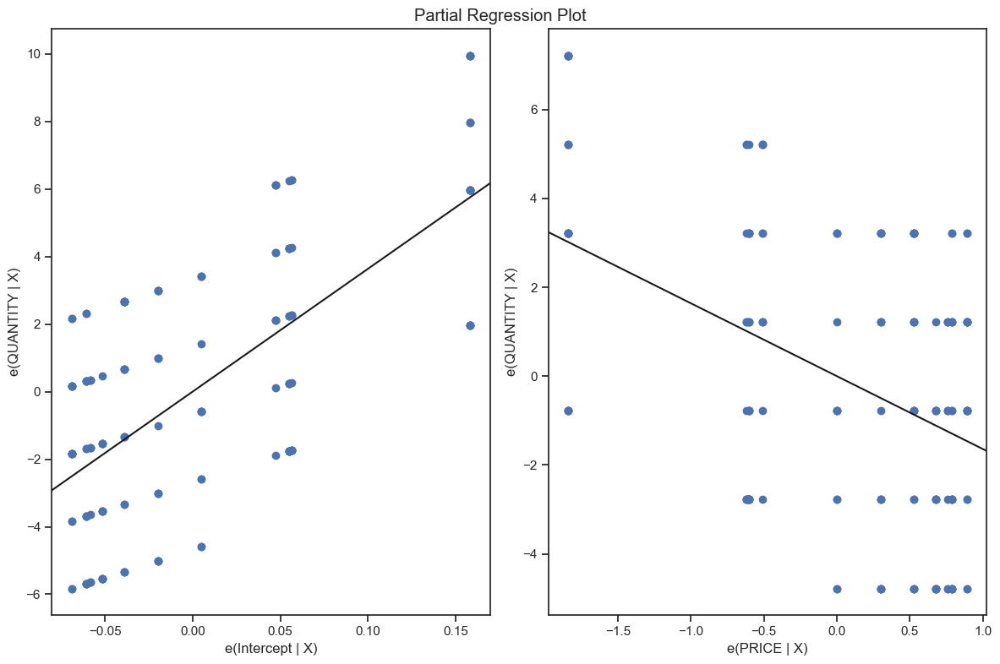

In [283]:
# burger 2052
burger2052_data = bau2_data[(bau2_data['ITEM_NAME'] == "BURGER") & (bau2_data['SELL_ID'] == 2052)]
elasticities['burger_2052'], model_burger_2052 = create_model_and_find_elasticity(burger2052_data)

Price elasticiy of the product: -4.394053351507931
                            OLS Regression Results                            
Dep. Variable:               QUANTITY   R-squared:                       0.683
Model:                            OLS   Adj. R-squared:                  0.682
Method:                 Least Squares   F-statistic:                     349.8
Date:                Mon, 26 Aug 2024   Prob (F-statistic):           2.58e-42
Time:                        02:01:05   Log-Likelihood:                -410.58
No. Observations:                 164   AIC:                             825.2
Df Residuals:                     162   BIC:                             831.4
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
I

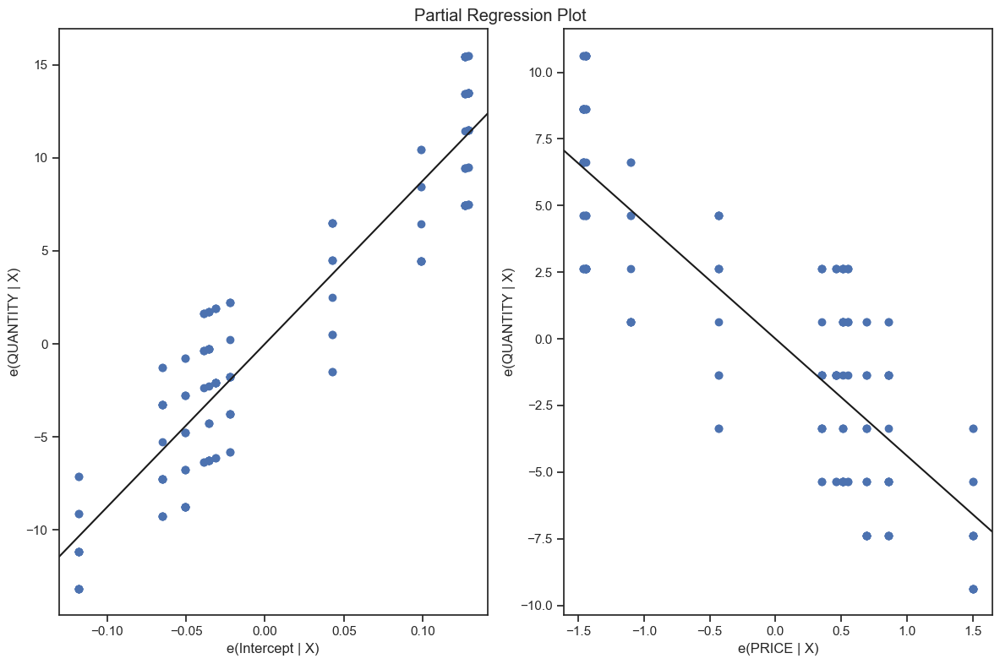

In [284]:
# burger 2053
burger2053_data = bau2_data[(bau2_data['ITEM_NAME'] == "BURGER") & (bau2_data['SELL_ID'] == 2053)]
elasticities['burger_2053'], model_burger_2053 = create_model_and_find_elasticity(burger2053_data)

- Currently, the price elasticity values of -5 and -4 appear to be specific to the burgers at this particular cafe.

Price elasticiy of the product: -4.6926436847459865
                            OLS Regression Results                            
Dep. Variable:               QUANTITY   R-squared:                       0.314
Model:                            OLS   Adj. R-squared:                  0.312
Method:                 Least Squares   F-statistic:                     149.2
Date:                Mon, 26 Aug 2024   Prob (F-statistic):           1.63e-28
Time:                        02:01:32   Log-Likelihood:                -1065.0
No. Observations:                 328   AIC:                             2134.
Df Residuals:                     326   BIC:                             2142.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------


(-4.6926436847459865,
 <statsmodels.regression.linear_model.RegressionResultsWrapper at 0x17c59a240>)

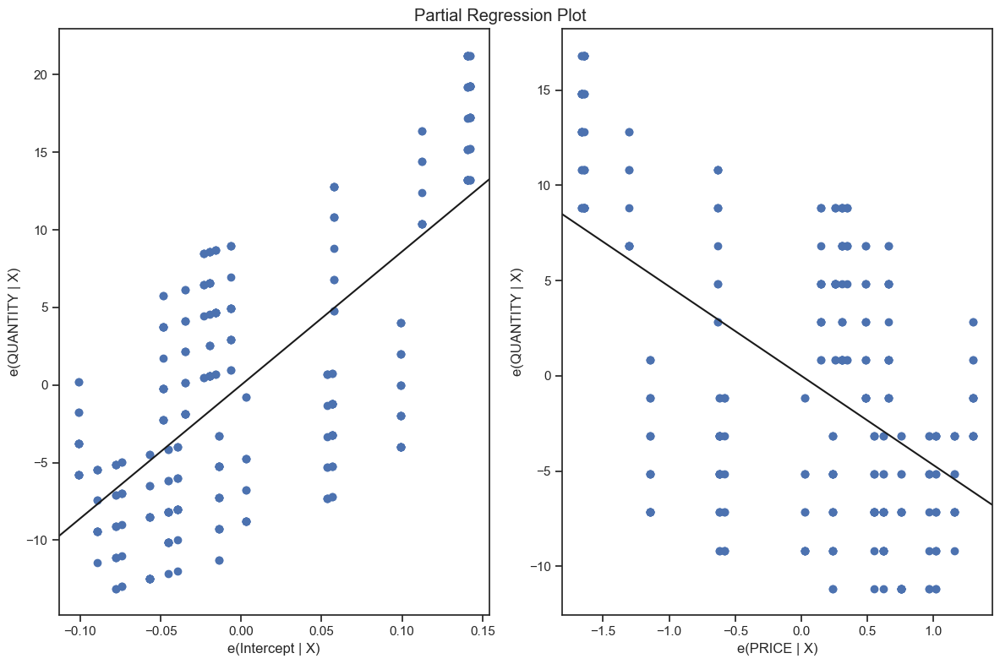

In [285]:
# coke data
coke_data = bau2_data[bau2_data['ITEM_NAME'] == "COKE"]
create_model_and_find_elasticity(coke_data)

- From this, we can infer that there are two groups of Cokes: one sold individually and the other as part of a combo.

In [130]:
# Unlikely to purchase a single coke. no purchase of coke for sell id 3067
# coke_data = bau2_data[(bau2_data['ITEM_NAME'] == "COKE") & (bau2_data['SELL_ID'] == 3067)]
# elasticities['coke_3067'], model_coke_3067 = create_model_and_find_elasticity(coke_data)

Price elasticiy of the product: -4.394053351507931
                            OLS Regression Results                            
Dep. Variable:               QUANTITY   R-squared:                       0.683
Model:                            OLS   Adj. R-squared:                  0.682
Method:                 Least Squares   F-statistic:                     349.8
Date:                Mon, 26 Aug 2024   Prob (F-statistic):           2.58e-42
Time:                        02:02:24   Log-Likelihood:                -410.58
No. Observations:                 164   AIC:                             825.2
Df Residuals:                     162   BIC:                             831.4
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
I

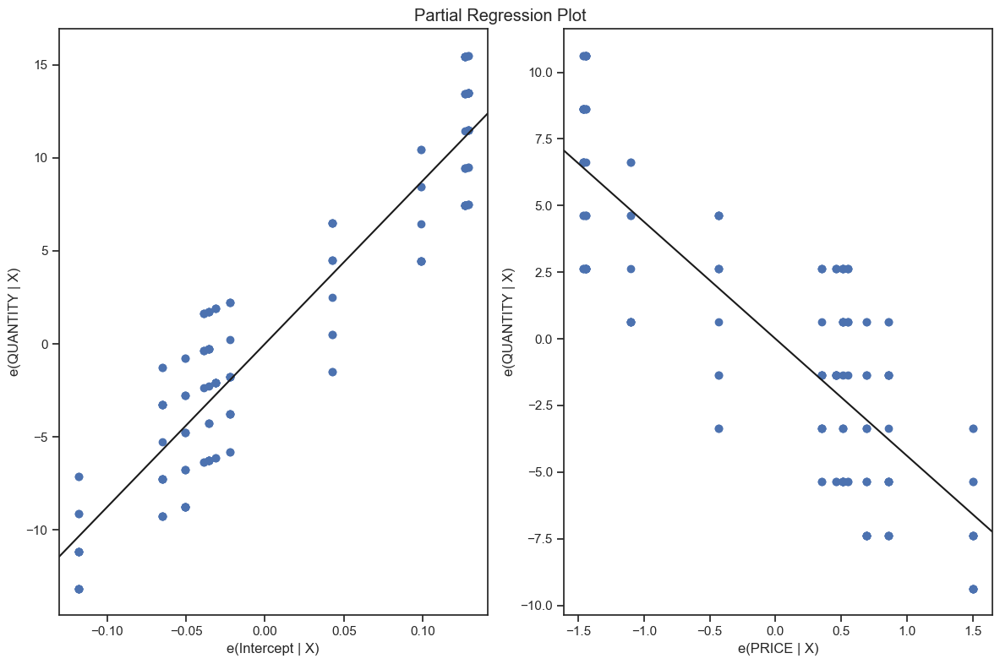

In [286]:
# coke 2053
coke_data_2053 = bau2_data[(bau2_data['ITEM_NAME'] == "COKE") & (bau2_data['SELL_ID'] == 2053)]
elasticities['coke_2053'], model_coke_2053 = create_model_and_find_elasticity(coke_data_2053)

Price elasticiy of the product: -1.353355848070374
                            OLS Regression Results                            
Dep. Variable:               QUANTITY   R-squared:                       0.119
Model:                            OLS   Adj. R-squared:                  0.113
Method:                 Least Squares   F-statistic:                     21.83
Date:                Mon, 26 Aug 2024   Prob (F-statistic):           6.22e-06
Time:                        02:02:33   Log-Likelihood:                -397.46
No. Observations:                 164   AIC:                             798.9
Df Residuals:                     162   BIC:                             805.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
I

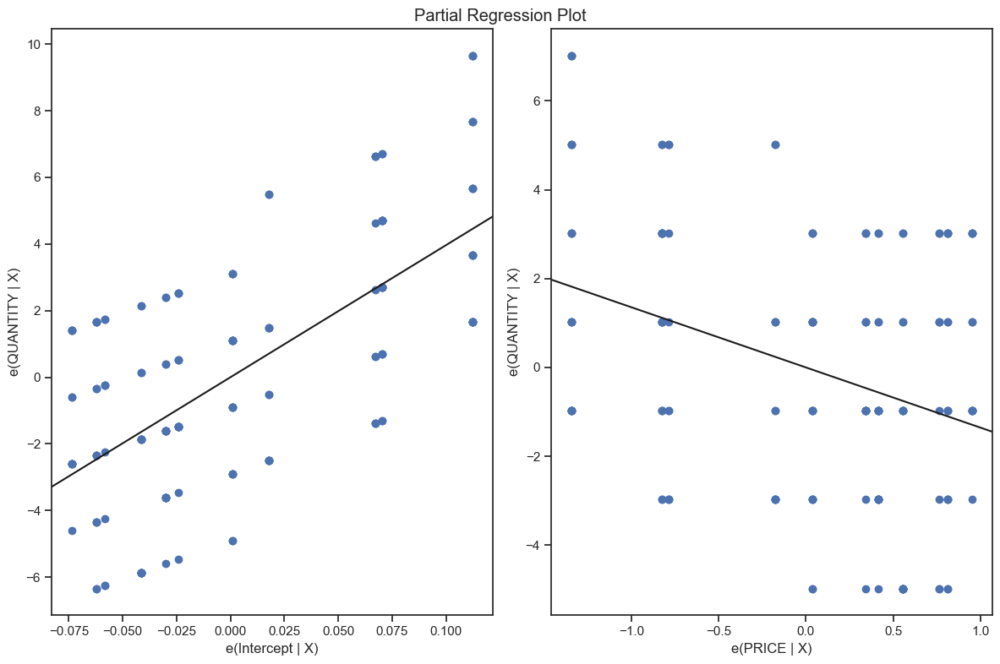

In [287]:
# coke 2051
coke_data_2051 = bau2_data[(bau2_data['ITEM_NAME'] == "COKE") & (bau2_data['SELL_ID'] == 2051)]
elasticities['coke_2051'], model_coke_2051 = create_model_and_find_elasticity(coke_data_2051)

Price elasticiy of the product: -1.6395517886297843
                            OLS Regression Results                            
Dep. Variable:               QUANTITY   R-squared:                       0.195
Model:                            OLS   Adj. R-squared:                  0.190
Method:                 Least Squares   F-statistic:                     39.31
Date:                Mon, 26 Aug 2024   Prob (F-statistic):           3.15e-09
Time:                        02:02:38   Log-Likelihood:                -405.10
No. Observations:                 164   AIC:                             814.2
Df Residuals:                     162   BIC:                             820.4
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------


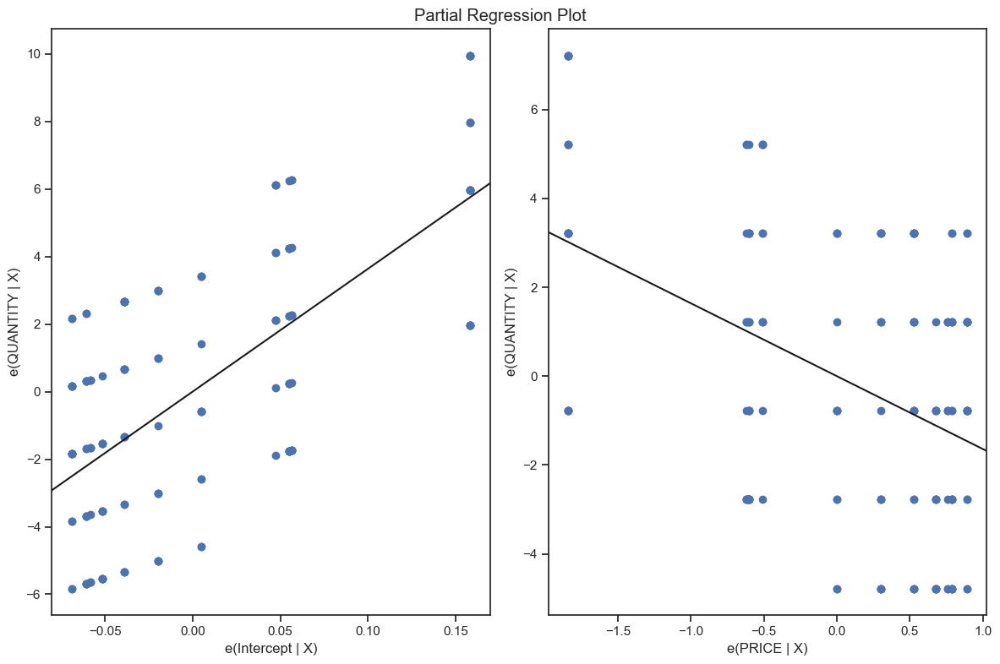

In [288]:
# Lemonde sell id 2052
lemonade_data_2052 = bau2_data[(bau2_data['ITEM_NAME'] == "LEMONADE") & (bau2_data['SELL_ID'] == 2052)]
elasticities['lemonade_2052'], model_lemonade_2052 = create_model_and_find_elasticity(lemonade_data_2052)

In [289]:
# No transaction with this particular lemonade 3028
# lemonade_data_3028 = bau2_data[(bau2_data['ITEM_NAME'] == "LEMONADE") & (bau2_data['SELL_ID'] == 3028)]
# elasticities['lemonade_3028'], model_lemonade_3028  = create_model_and_find_elasticity(lemonade_data_3028)

Price elasticiy of the product: -4.394053351507931
                            OLS Regression Results                            
Dep. Variable:               QUANTITY   R-squared:                       0.683
Model:                            OLS   Adj. R-squared:                  0.682
Method:                 Least Squares   F-statistic:                     349.8
Date:                Mon, 26 Aug 2024   Prob (F-statistic):           2.58e-42
Time:                        02:02:44   Log-Likelihood:                -410.58
No. Observations:                 164   AIC:                             825.2
Df Residuals:                     162   BIC:                             831.4
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
I

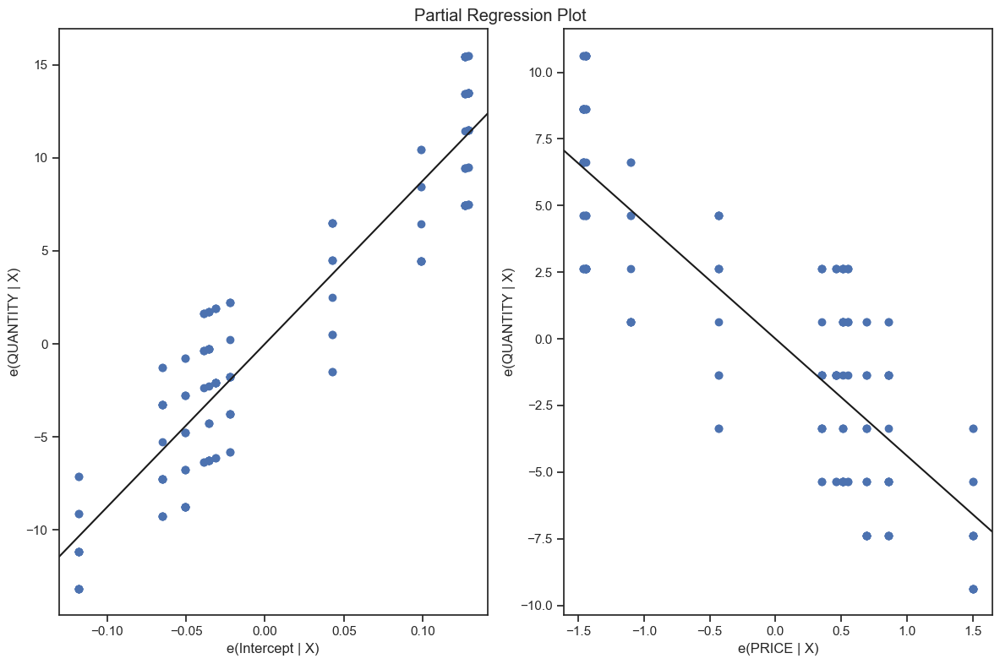

In [290]:
# coffee with sell id 2053
coffee_data_2053 = bau2_data[(bau2_data['ITEM_NAME'] == "COFFEE") & (bau2_data['SELL_ID'] == 2053)]
elasticities['coffee_2053'], model_coffee_2053 = create_model_and_find_elasticity(coffee_data_2053)

In [291]:
# No transaction for coffee with sell id 3055
# coffee_data_3055 = bau2_data[(bau2_data['ITEM_NAME'] == "COFFEE") & (bau2_data['SELL_ID'] == 3055)]
# elasticities['coffee_3055'], model_coffee_3055  = create_model_and_find_elasticity(coffee_data_3055)

#### listing the elasticities in table

In [293]:
elasticities

{'burger_1070': -5.351266740100875,
 'burger_2051': -1.353355848070374,
 'burger_2052': -1.6395517886297843,
 'burger_2053': -4.394053351507931,
 'coke_2053': -4.394053351507931,
 'coke_2051': -1.353355848070374,
 'lemonade_2052': -1.6395517886297843,
 'coffee_2053': -4.394053351507931}

<a name='7.1'></a>
#### Optimal Price for Maximum Profit

- Let's use Coke for this analysis. Since we don't know the buying price of Coke, we'll assume it to be slightly below the minimum price listed for Coke in the dataset.

In [294]:
coke_data.PRICE.min()

10.45

In [295]:
coke_data.PRICE.max()

13.41

Let's set the buying price of Coke to 9. Our goal now is to determine the optimal selling price for Coke to maximize profit, where PRICE represents the selling price.

In [296]:
buying_price_coke = 9

$$cokedata.PROFIT = (cokedata.PRICE - buyingpricecoke)* cokedata.QUANTITY$$

* Let's see the profit for various price points

In [297]:
# random price points that make sense
start_price = 9.5
end_price = 20

In [298]:
# test dataset
test = pd.DataFrame(columns= [ "PRICE", "QUANTITY"])

In [299]:
# price in step of 0.01 and denominations increase in that sense
test["PRICE"] = np.arange(start_price, end_price, 0.01)

In [300]:
# quantity for 2051
test["QUANTITY"] = model_coke_2051.predict(test["PRICE"])

In [301]:
test 

,PRICE,QUANTITY
0,9.50,26.785967
1,9.51,26.772433
2,9.52,26.758900
3,9.53,26.745366
4,9.54,26.731832
5,9.55,26.718299
6,9.56,26.704765
7,9.57,26.691232
8,9.58,26.677698
9,9.59,26.664165


In [302]:
# Profit
test['PROFIT'] = (test["PRICE"] - buying_price_coke) * test['QUANTITY'] 

In [303]:
test 

,PRICE,QUANTITY,PROFIT
0,9.50,26.785967,13.392983
1,9.51,26.772433,13.653941
2,9.52,26.758900,13.914628
3,9.53,26.745366,14.175044
4,9.54,26.731832,14.435190
5,9.55,26.718299,14.695064
6,9.56,26.704765,14.954669
7,9.57,26.691232,15.214002
8,9.58,26.677698,15.473065
9,9.59,26.664165,15.731857


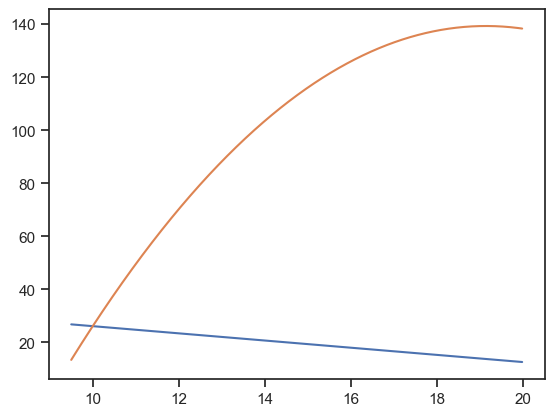

In [304]:
# lest visualize the tabular form above
plt.plot(test['PRICE'], test['QUANTITY'])
plt.plot(test['PRICE'], test['PROFIT'])
plt.show()

- We have a blue line showing price against quantity and an orange line showing price against profit.
- We need to identify the maximum point on the orange curve to determine the exact selling price that yields the maximum profit.

In [305]:
# figure out the index point for max profit
ind = np.where(test['PROFIT'] == test['PROFIT'].max())[0][0]

In [306]:
# Row index , this will only be profit on a particular day. This will help do some inventory planning on a normal day
# not considering special days like holidays.
test.loc[[ind]]

,PRICE,QUANTITY,PROFIT
965,19.15,13.726083,139.319739


In [307]:
# Generic function for optimal price
# define a function for finding the optimal price
def find_optimal_price(data, model, buying_price):
    start_price = data.PRICE.min() - 1              # start price
    end_price = data.PRICE.min() + 10               # end price
    test = pd.DataFrame(columns = ["PRICE", "QUANTITY"])  # choose required columns
    test['PRICE'] = np.arange(start_price, end_price,0.01)
    test['QUANTITY'] = model.predict(test['PRICE'])         # make predictions
    test['PROFIT'] = (test["PRICE"] - buying_price) * test["QUANTITY"]
    plt.plot(test['PRICE'],test['QUANTITY'])       # plot the results 
    plt.plot(test['PRICE'],test['PROFIT']) 
    plt.show()
    ind = np.where(test['PROFIT'] == test['PROFIT'].max())[0][0]
    values_at_max_profit = test.iloc[[ind]]
    return values_at_max_profit

<a name='7.2'></a>
#### Calculate the optimal price for all and list in table

In [308]:
# dict of optimal price and set min bying price to be 9 due to initial scatter plot of price and quantity of combined data
optimal_price = {}
buying_price = 9

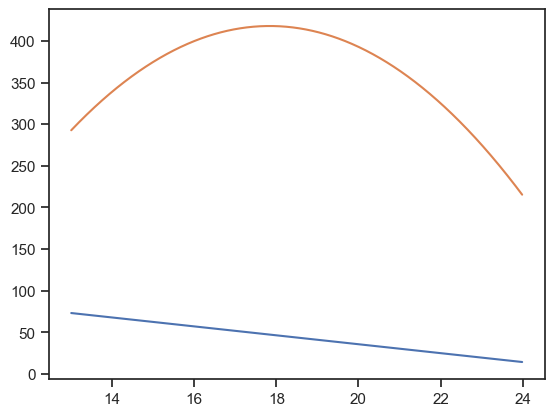

In [309]:
optimal_price['burger_1070'] = find_optimal_price(burger_1070, model_burger_1070, buying_price)

* No cross over in profit curve and the quantity curve for this particular burger 1070 so prolly much profit made when sold individually

In [310]:
# optimal price
optimal_price

{'burger_1070':      PRICE   QUANTITY      PROFIT
 484  17.84  47.276517  417.924409}

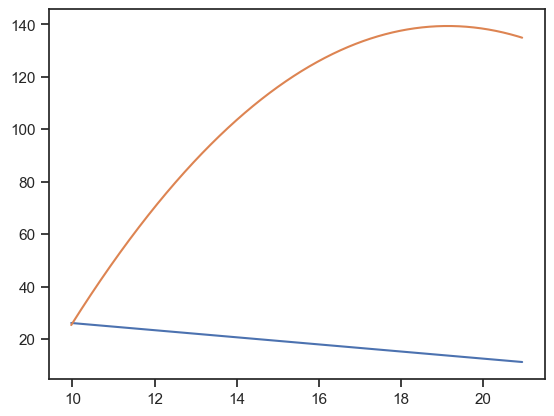

In [311]:
optimal_price['burger_2051'] = find_optimal_price(burger2051_data, model_burger_2051, buying_price)

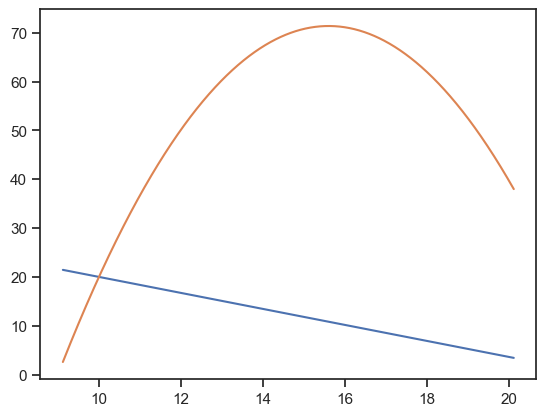

In [312]:
optimal_price['burger_2052'] = find_optimal_price(burger2052_data, model_burger_2052, buying_price)

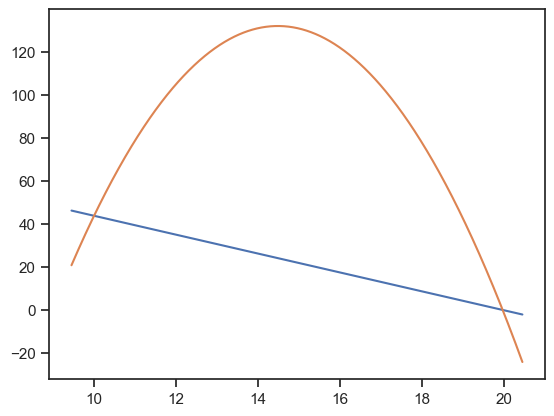

In [313]:
optimal_price['burger_2053'] = find_optimal_price(burger2053_data, model_burger_2053, buying_price)

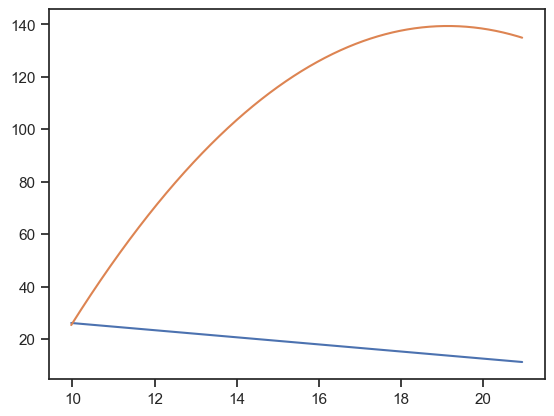

In [314]:
optimal_price['coke_2051'] = find_optimal_price(coke_data_2051, model_coke_2051, buying_price)

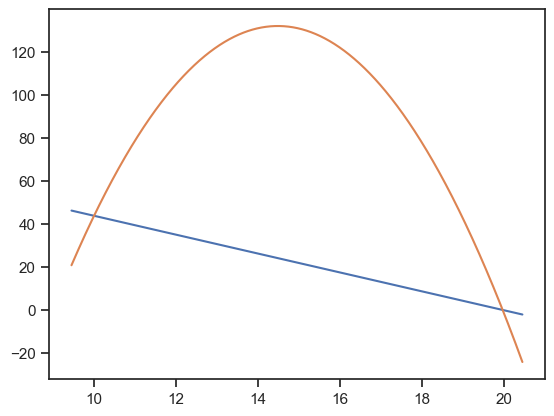

In [315]:
optimal_price['coke_2053'] = find_optimal_price(coke_data_2053, model_coke_2053, buying_price)

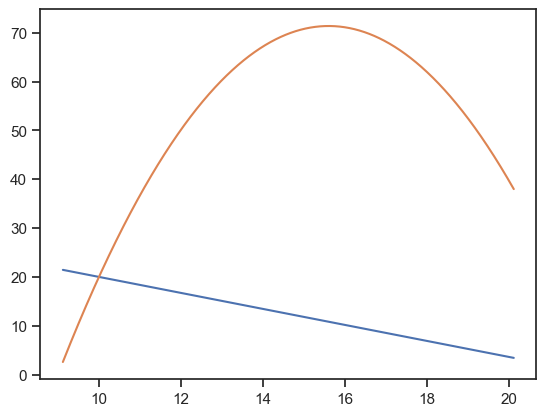

In [316]:
optimal_price['lemonade_2052'] = find_optimal_price(lemonade_data_2052, model_lemonade_2052, buying_price)

In [317]:
# optimal price 
optimal_price

{'burger_1070':      PRICE   QUANTITY      PROFIT
 484  17.84  47.276517  417.924409,
 'burger_2051':      PRICE   QUANTITY      PROFIT
 918  19.15  13.726083  139.319739,
 'burger_2052':      PRICE   QUANTITY     PROFIT
 648   15.6  10.812419  71.361968,
 'burger_2053':      PRICE   QUANTITY      PROFIT
 503  14.48  24.074744  131.929598,
 'coke_2051':      PRICE   QUANTITY      PROFIT
 918  19.15  13.726083  139.319739,
 'coke_2053':      PRICE   QUANTITY      PROFIT
 503  14.48  24.074744  131.929598,
 'lemonade_2052':      PRICE   QUANTITY     PROFIT
 648   15.6  10.812419  71.361968}

In [318]:
# look at initial price
coke_data_2051.PRICE.describe()

count    164.000000
mean      12.315488
std        0.743054
min       10.970000
25%       11.530000
50%       12.660000
75%       12.870000
max       13.270000
Name: PRICE, dtype: float64

<a name='8'></a>
### Conclusion

- We observed that the maximum price was $13.27, while the optima $19.15. This suggests that the cafe was missing out on potential profit. Although setting the price at $19.15 might reduce the quantity sold, it would increase overall profit.

- This analysis applies to a typical day; however, special days like holidays or events can alter customer buying patterns, often leading to increased consumption. These days should be treated separately.

- It's also crucial to account for any external factors affecting purchasing behavior, such as discounts. In this case, no items were discounted.

- With the new price points established for each item, it's important to continuously monitor sales and profits. Creating a dashboard can help track these metrics and optimize profits.